## Introduzione
Caricamento dataset e modifiche iniziali

In [1]:
from google.colab import drive

drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv("drive/MyDrive/smoking.csv", sep=",")

Per il progetto è stato selezionato un dataset con vari attributi diversificati, tra cui genere, altezza, peso, valore di emoglobina, e altri ancora. L'obiettivo primario dei modelli che andremo a sviluppare è predire se un individuo è un fumatore o meno.

In [4]:
df.head()

,ID,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),...,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking
0,0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,...,12.9,1.0,0.7,18.0,19.0,27.0,Y,0,Y,0
1,1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,...,12.7,1.0,0.6,22.0,19.0,18.0,Y,0,Y,0
2,2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,...,15.8,1.0,1.0,21.0,16.0,22.0,Y,0,N,1
3,3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,...,14.7,1.0,1.0,19.0,26.0,18.0,Y,0,Y,0
4,4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,...,12.5,1.0,0.6,16.0,14.0,22.0,Y,0,N,0


Si è deciso di ridurre la dimensione del dataset da oltre 50.000 a 10.000 valori al fine di ottimizzare i tempi di addestramento dei modelli, garantendo così una maggiore efficienza nel processo di analisi e sviluppo. È importante sottolineare che nonostante questa riduzione, il rapporto tra i valori delle due classi della colonna target rimane invariato, mantenendo l'integrità e la rappresentatività dei dati.

In [5]:
original_counts = df['smoking'].value_counts()
print("Counts nel dataset originale:\n", original_counts)
print("Rapporto:\n", original_counts[0]/original_counts[1])

df = df[:10000]

sampled_counts = df['smoking'].value_counts()
print("\nCounts nel dataset partizionato:\n", sampled_counts)
print("Rapporto:\n", sampled_counts[0]/sampled_counts[1])

Counts nel dataset originale:
 0    35237
1    20455
Name: smoking, dtype: int64
Rapporto:
 1.7226594964556343

Counts nel dataset partizionato:
 0    6384
1    3616
Name: smoking, dtype: int64
Rapporto:
 1.7654867256637168


Innanzitutto eliminiamo la colonna "ID" in quanto non è indicativa per il nostro target: "smoking"

In [6]:
df = df.drop(['ID'], axis=1)

In [7]:
df.dtypes

gender                  object
age                      int64
height(cm)               int64
weight(kg)               int64
waist(cm)              float64
eyesight(left)         float64
eyesight(right)        float64
hearing(left)          float64
hearing(right)         float64
systolic               float64
relaxation             float64
fasting blood sugar    float64
Cholesterol            float64
triglyceride           float64
HDL                    float64
LDL                    float64
hemoglobin             float64
Urine protein          float64
serum creatinine       float64
AST                    float64
ALT                    float64
Gtp                    float64
oral                    object
dental caries            int64
tartar                  object
smoking                  int64
dtype: object

Per semplificare il processo di analisi e trattamento dei dati, abbiamo convertito le colonne che originariamente contenevano solo valori "M/F" o "Y/N" in un formato binario utilizzando la codifica 0/1. Questa trasformazione consente una maggiore uniformità e facilità di manipolazione dei dati durante le fasi di elaborazione e modellazione. Anziché gestire valori testuali come "M" o "F", ora possiamo utilizzare valori numerici come 1 per "M" e 0 per "F", e 1 per "Y" e 0 per "N".

In [8]:
df['tartar'] = df['tartar'].apply(lambda x: 1 if x == 'Y' else 0)
df['gender'] = df['gender'].apply(lambda x: 1 if x == 'M' else 0)
df['oral'] = df['oral'].apply(lambda x: 1 if x == 'Y' else 0)

In [9]:
df.dtypes

gender                   int64
age                      int64
height(cm)               int64
weight(kg)               int64
waist(cm)              float64
eyesight(left)         float64
eyesight(right)        float64
hearing(left)          float64
hearing(right)         float64
systolic               float64
relaxation             float64
fasting blood sugar    float64
Cholesterol            float64
triglyceride           float64
HDL                    float64
LDL                    float64
hemoglobin             float64
Urine protein          float64
serum creatinine       float64
AST                    float64
ALT                    float64
Gtp                    float64
oral                     int64
dental caries            int64
tartar                   int64
smoking                  int64
dtype: object

## Analisi covariate

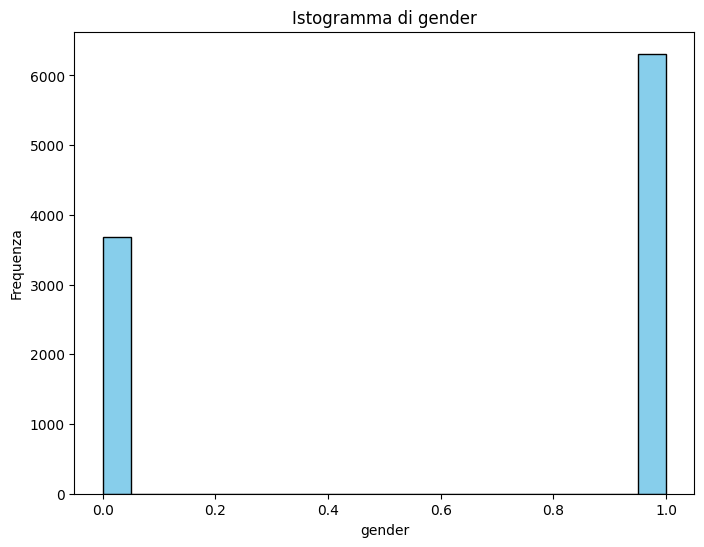

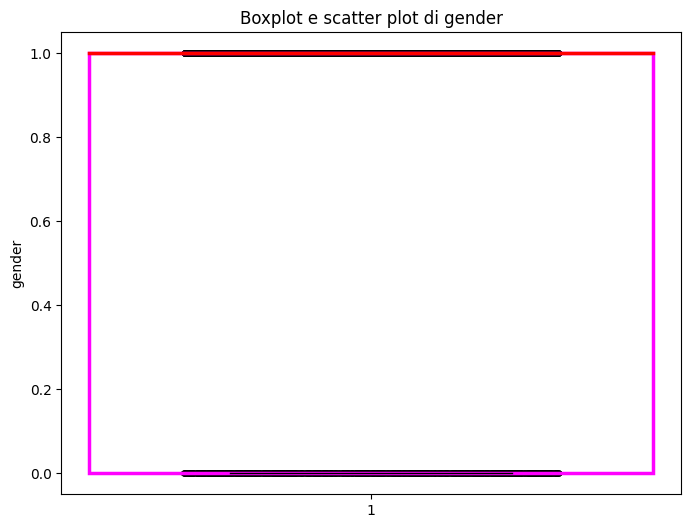

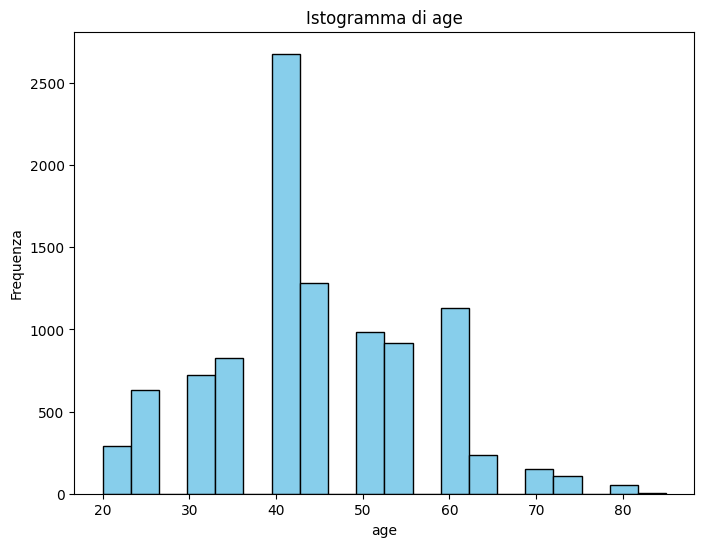

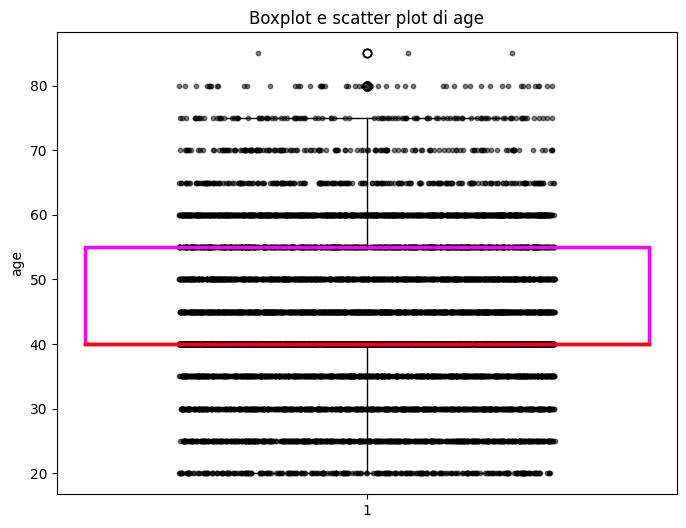

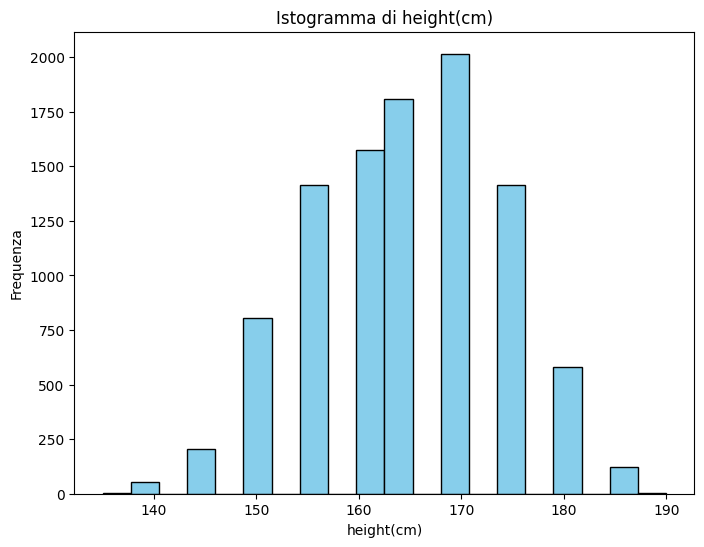

...

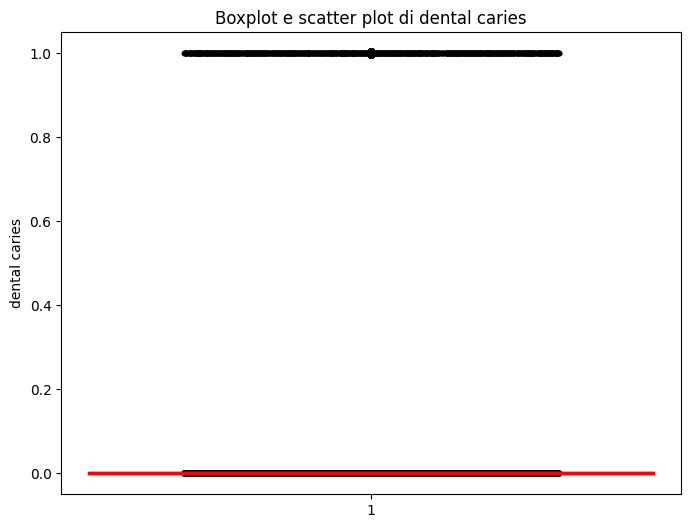

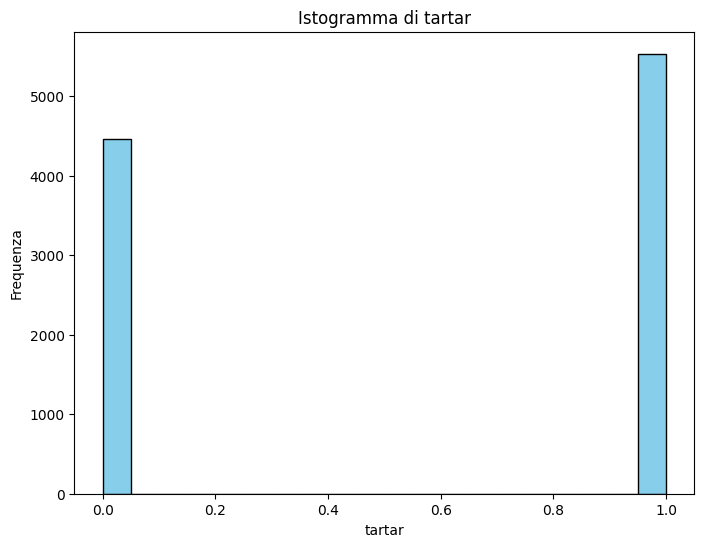

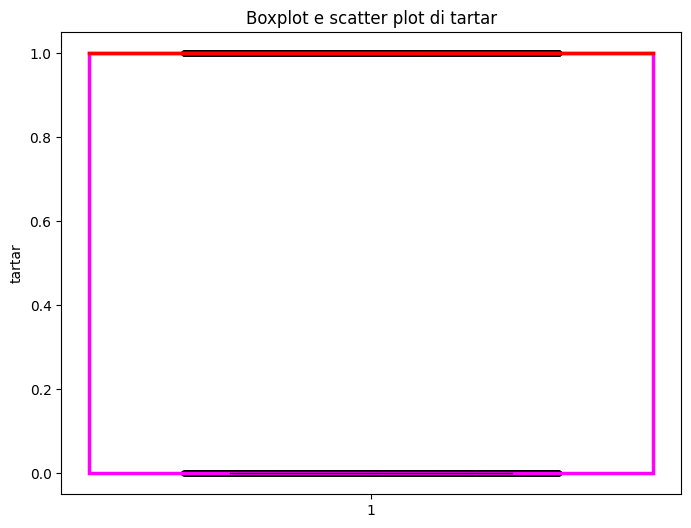

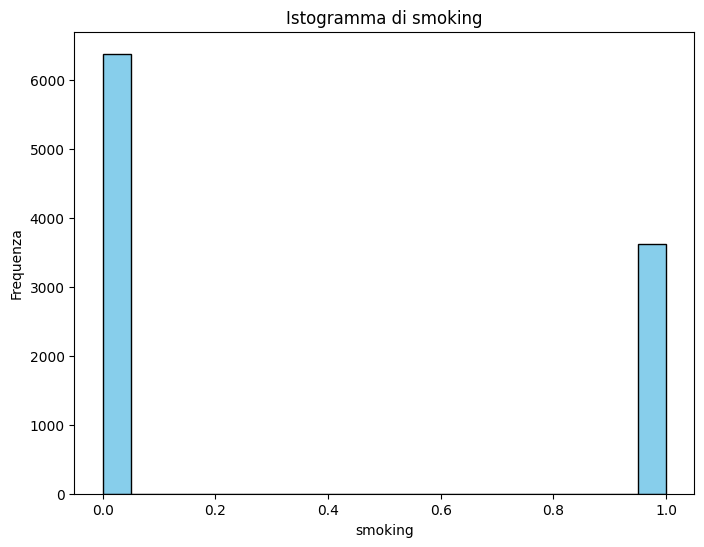

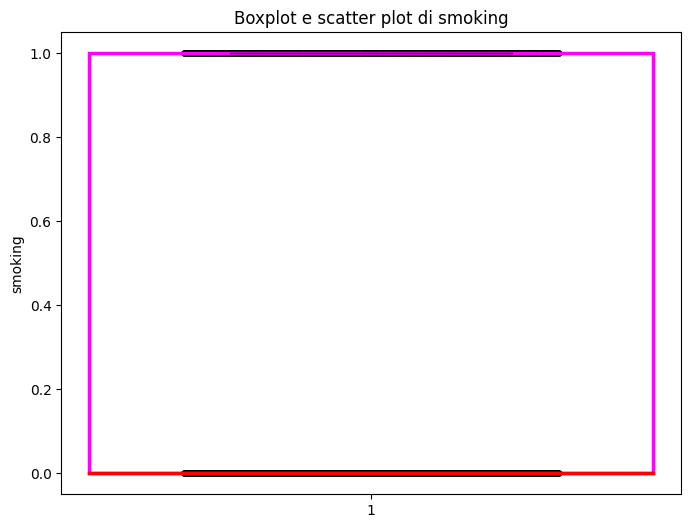

In [10]:
import numpy as np
# Crea un istogramma e un boxplot per ogni colonna del dataset
for col in df.columns:
    # Istogramma
    plt.figure(figsize=(8, 6))
    plt.hist(df[col], bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Istogramma di {col}')
    plt.xlabel(col)
    plt.ylabel('Frequenza')
    plt.show()

    x_values = np.random.uniform(0.5, 1.5, size=len(df[col]))

    plt.figure(figsize=(8, 6), facecolor='white')

    # Boxplot (sovrapposto a scatter plot)
    plt.boxplot(df[col], widths=1.5, patch_artist=True,  boxprops=dict(edgecolor=(1.0, 0.0, 1.0), facecolor='none', linewidth=2.5), medianprops=dict(color='red', linewidth=2.5))

    # Scatter plot
    plt.scatter(x_values, df[col], s=10, color='black', alpha=0.5)

    plt.title(f'Boxplot e scatter plot di {col}')
    plt.ylabel(col)
    plt.show()

Dai grafici e dalla cella che segue, emerge chiaramente che la colonna "oral" presenta un'unica classe. Di conseguenza, possiamo procedere con la sua eliminazione poiché non fornisce alcuna informazione utile per il nostro scopo.

In [11]:
print(df['oral'].unique())

[1]


In [12]:
df = df.drop(['oral'], axis=1)

In [13]:
attributi_binari = ['gender', 'hearing(left)', 'hearing(right)', 'dental caries', 'tartar']

attributi_continui = ['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'serum creatinine', 'AST', 'ALT', 'Gtp']

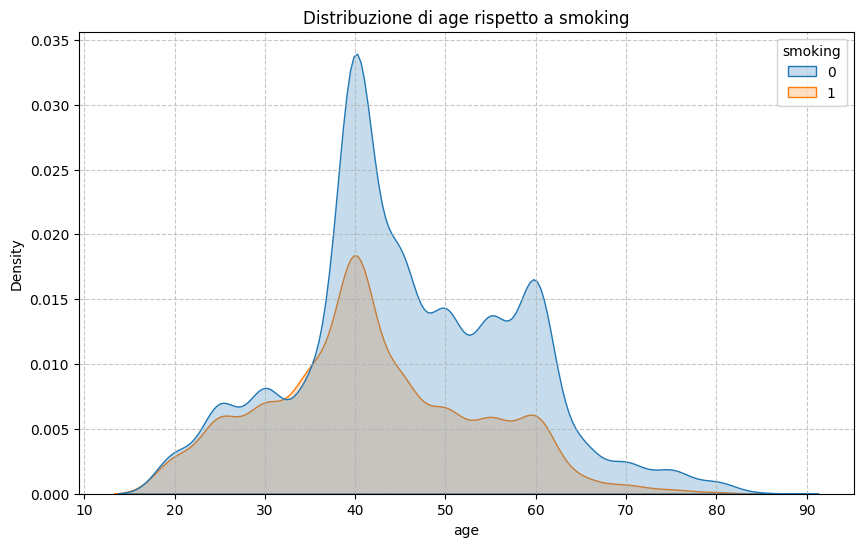

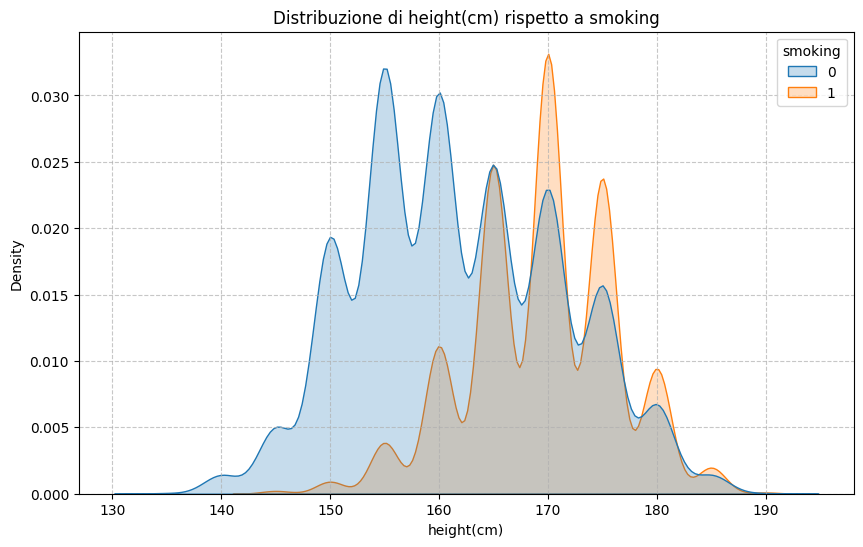

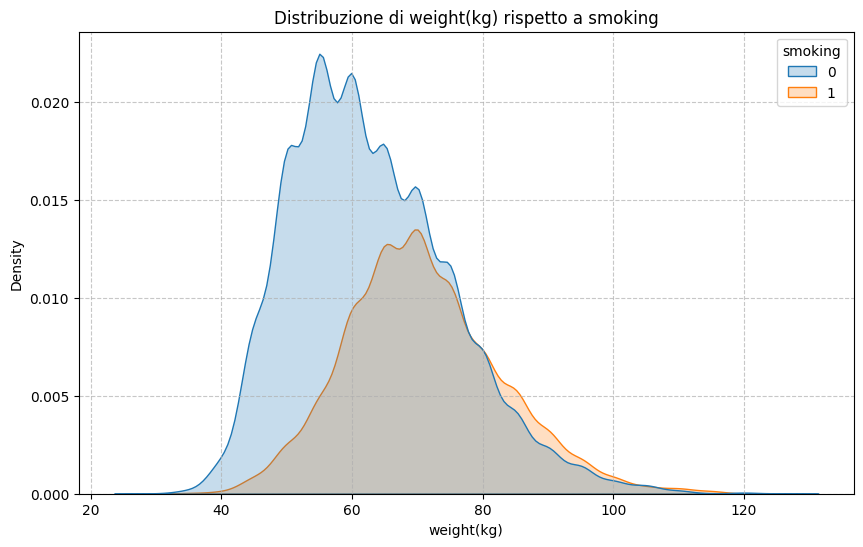

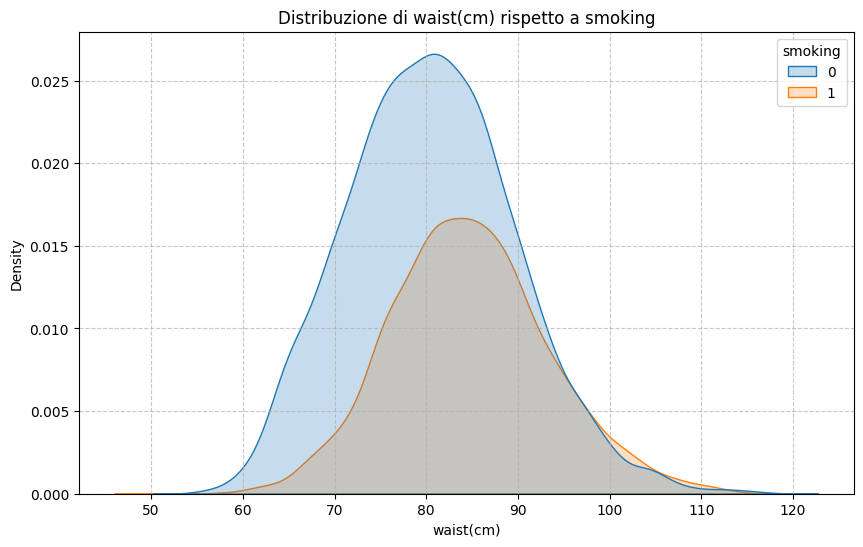

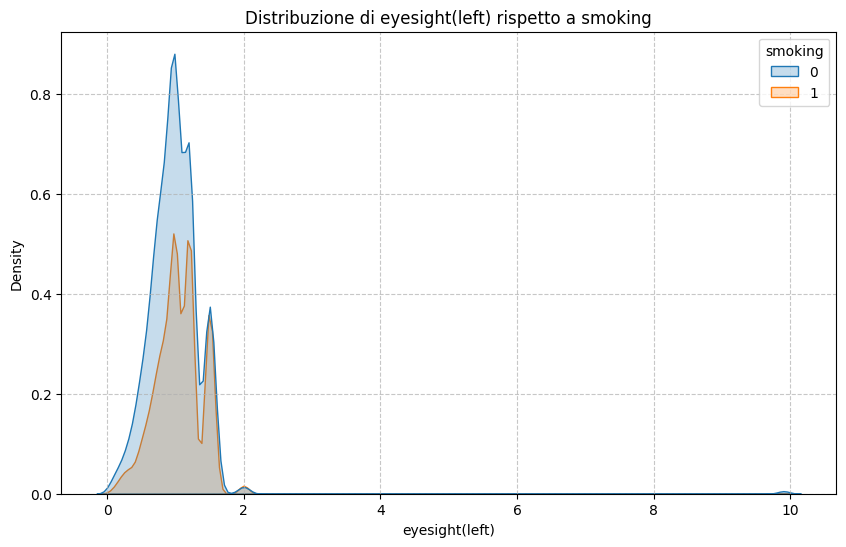

...

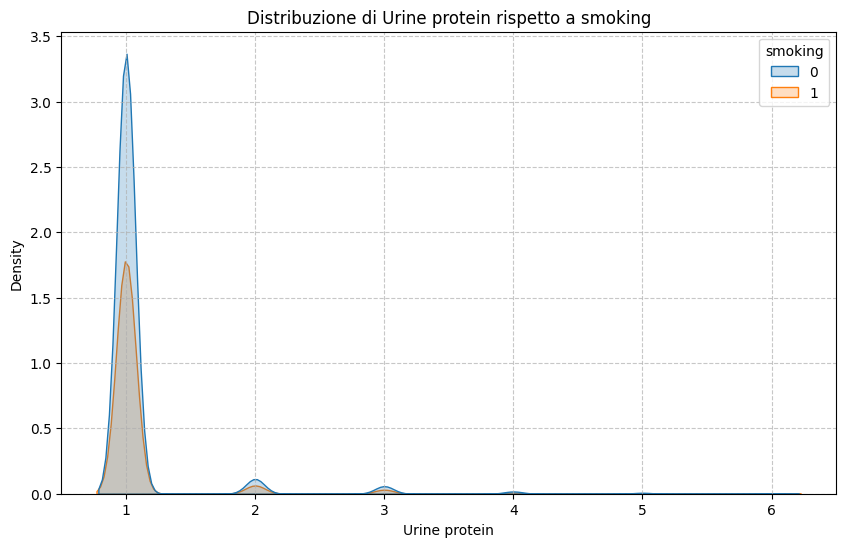

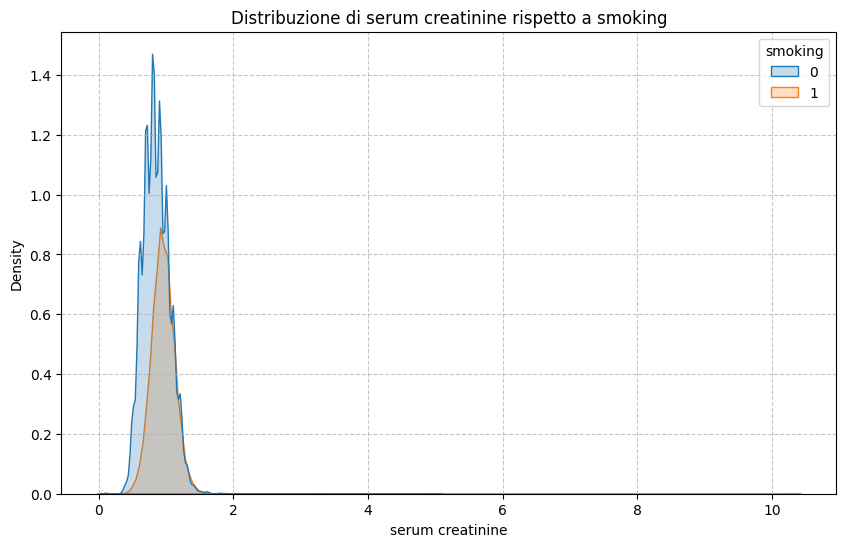

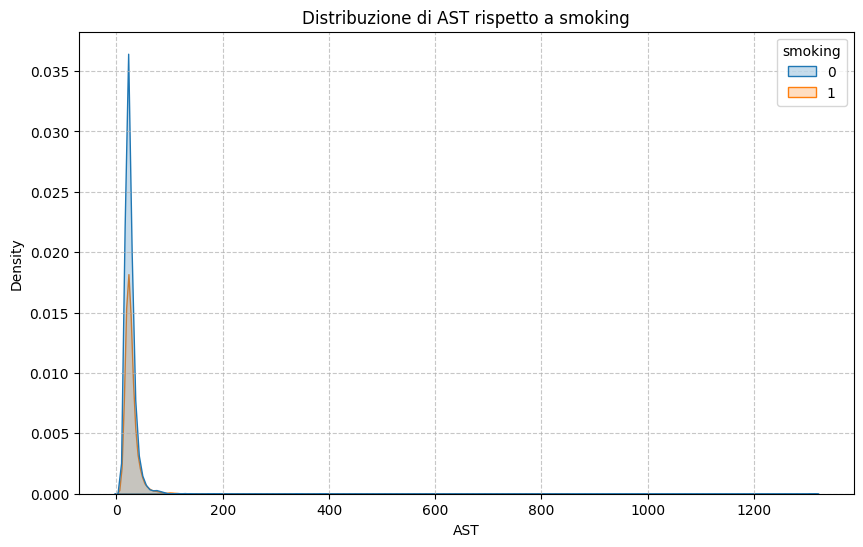

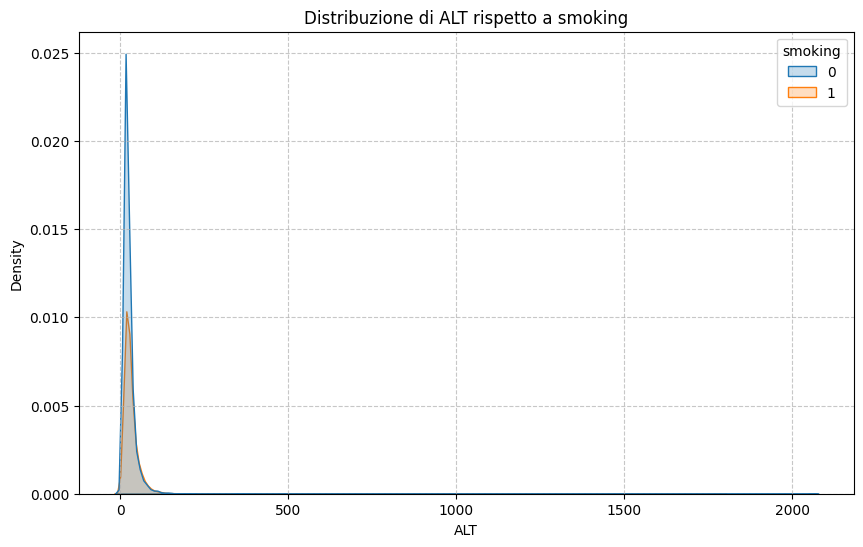

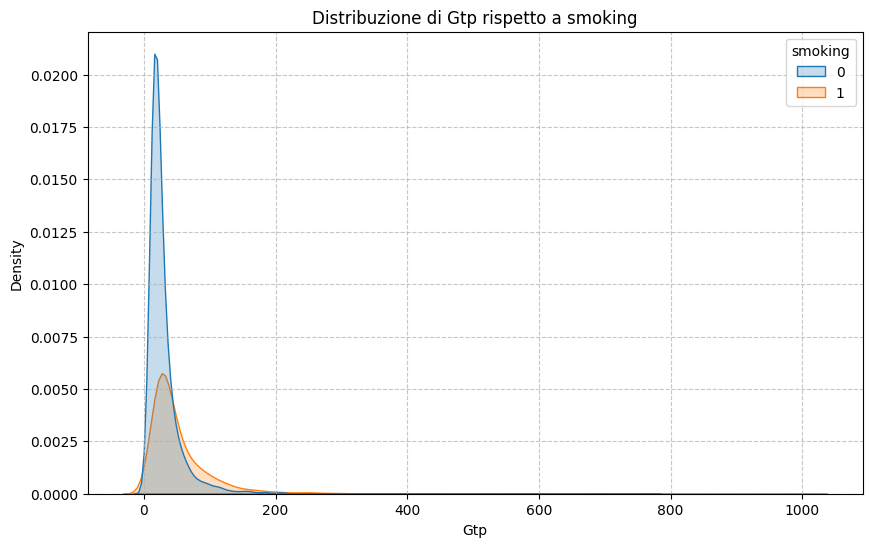

In [14]:
import seaborn as sns

#Creiamo i grafici bivariati per gli attributi continui
for attributo in attributi_continui:
    plt.figure(figsize=(10, 6))

    ax = plt.gca()
    ax.set_facecolor('white')
    ax.grid(True, linestyle='--', alpha=0.7)

    sns.kdeplot(data=df, x=attributo, hue='smoking', fill=True)
    plt.title(f'Distribuzione di {attributo} rispetto a smoking')
    plt.show()

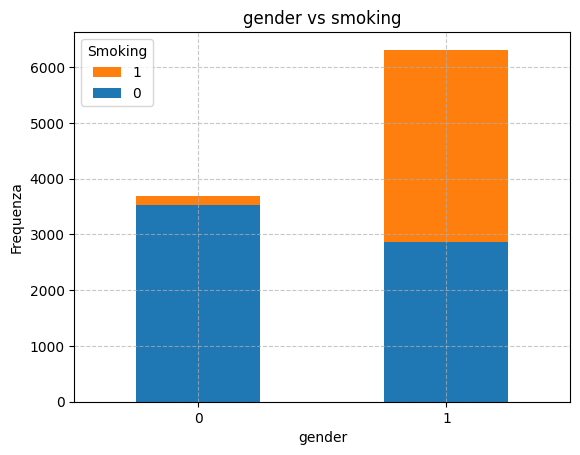

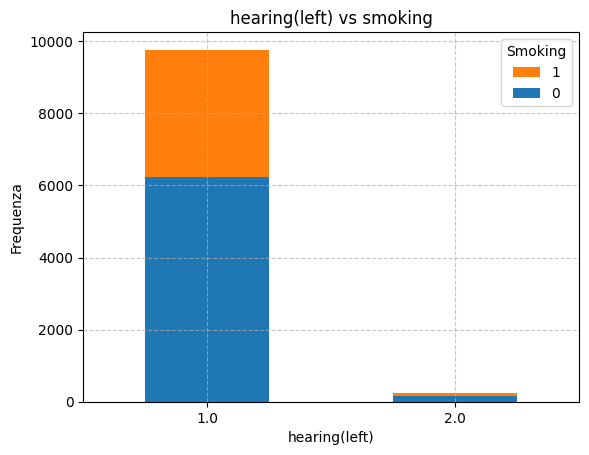

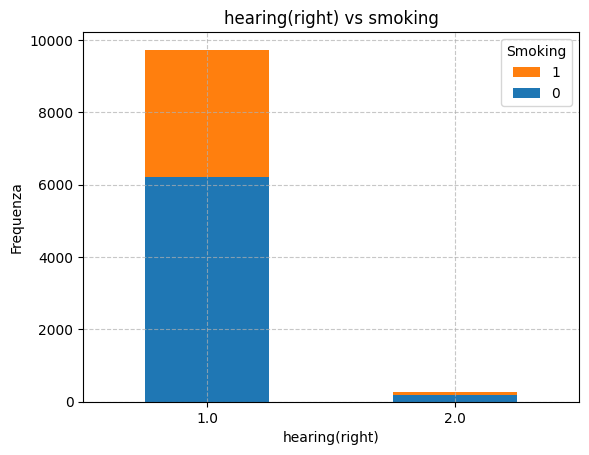

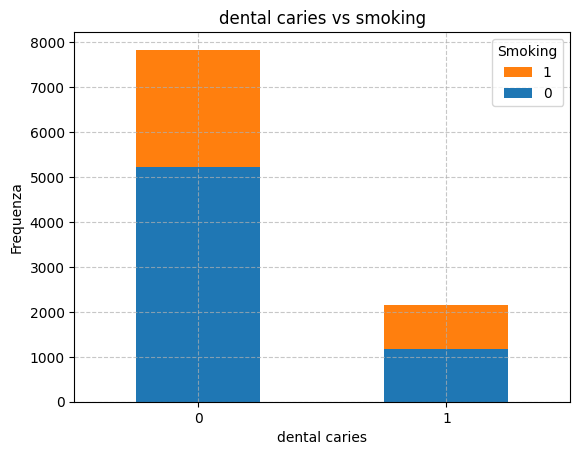

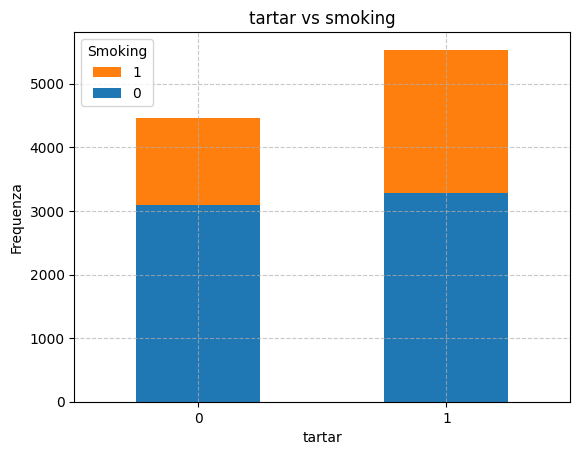

In [15]:
#Creiamo i grafici bivariati per gli attributi che presentano solo due classi (in questo caso sotto forma di istogrammi per favorire la leggibilità)
for attributo in attributi_binari:
    grouped = df.groupby([attributo, 'smoking']).size().unstack()

    ax = grouped.plot(kind='bar', stacked=True)

    ax.set_facecolor('white')
    ax.grid(True, linestyle='--', alpha=0.7)

    ax.set_title(f'{attributo} vs smoking')
    ax.set_xlabel(f'{attributo}')
    ax.set_ylabel('Frequenza')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[::-1], labels[::-1], title='Smoking')

    plt.show()

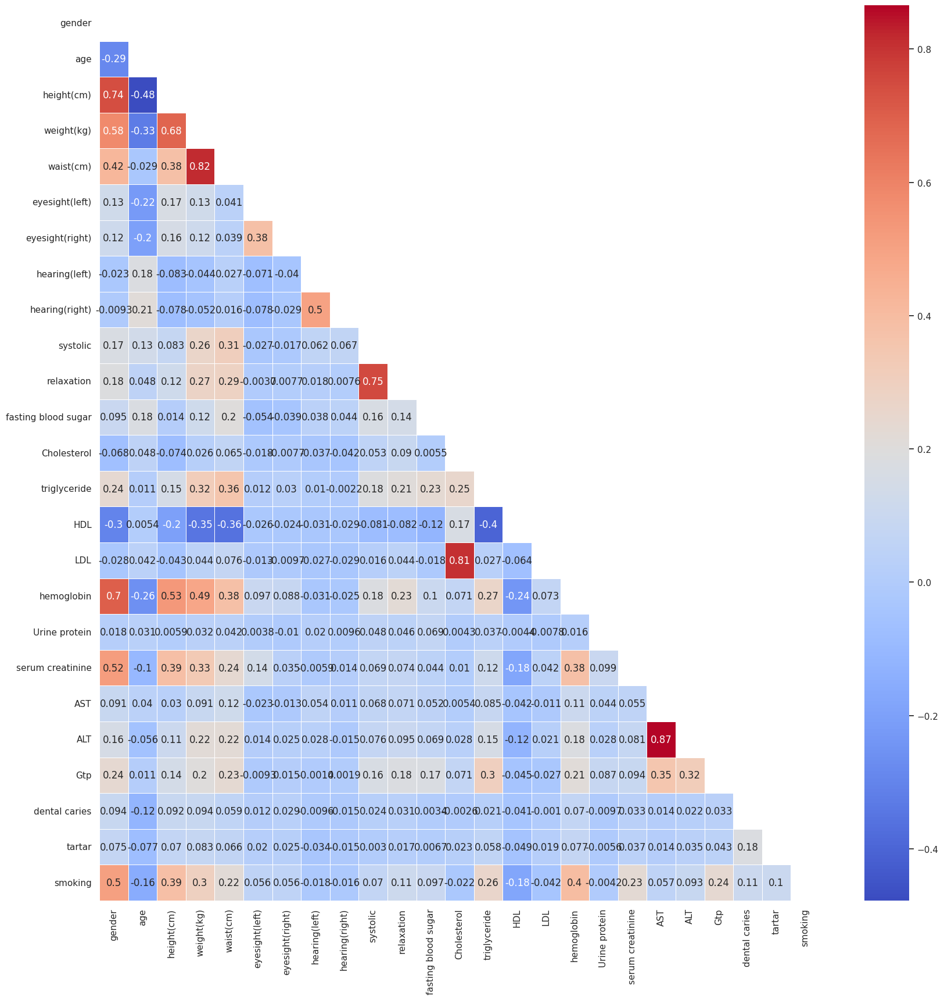

In [16]:
# Calcoliamo la matrice di correlazione
import numpy as np

correlation_matrix = df.corr()
sns.set(style="white")
plt.figure(figsize=(20, 20))

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5, mask=mask)

plt.show()

In [17]:
df = df.drop(['hearing(left)','hearing(right)'], axis=1)

Notiamo:

- forte correlazione positiva tra gender, height, weight, waist, triglyceride, hemoglobin, serum creatinine, gtp e la variabile target

- forte correlazione negativa tra hdl e variabile target

## PCA

Dato l'elevato numero di attributi nel dataset, intendiamo ridurre la sua dimensionalità identificando le componenti principali che catturano la maggior parte della variazione dei dati.

In [18]:
#Escludiamo la colonna target dalle colonne sottoposte alla PCA
variabili_pca = list(df.columns[:-1])
print(variabili_pca)

['gender', 'age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'serum creatinine', 'AST', 'ALT', 'Gtp', 'dental caries', 'tartar']


In [19]:
#Standardizziamo le colonne su cui andiamo a lavorare
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[variabili_pca])
scaled_data

array([[-1.30824185, -0.3498111 , -1.03837089, ..., -0.25219847,
        -0.5252006 ,  0.89833802],
       [-1.30824185, -0.3498111 , -0.49670637, ..., -0.42709473,
        -0.5252006 ,  0.89833802],
       [ 0.76438466,  0.89300428,  0.58662268, ..., -0.34936306,
        -0.5252006 , -1.11316673],
       ...,
       [ 0.76438466,  1.30727608,  0.58662268, ..., -0.21333263,
        -0.5252006 ,  0.89833802],
       [ 0.76438466, -0.7640829 ,  0.04495816, ..., -0.40766182,
        -0.5252006 ,  0.89833802],
       [ 0.76438466, -0.7640829 ,  1.1282872 , ..., -0.23276555,
        -0.5252006 ,  0.89833802]])

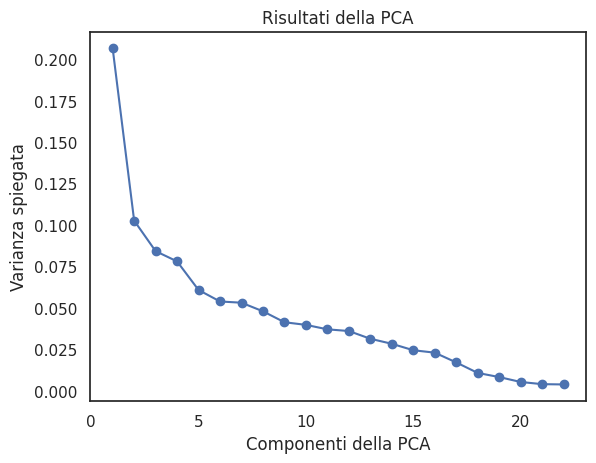

In [20]:
pca = PCA().fit(scaled_data)

# Creiamo un grafico della varianza spiegata per ogni componente
plt.plot(range(1, pca.n_components_ + 1), pca.explained_variance_ratio_, marker='o')
plt.xlabel('Componenti della PCA')
plt.ylabel('Varianza spiegata')
plt.title("Risultati della PCA")
plt.show()

In [21]:
# Calcolo della varianza spiegata e cumulativa
varianza_spiegata = pca.explained_variance_ratio_
varianza_cumulativa = varianza_spiegata.cumsum()

# Creazione della tabella
componenti_principali = [f"PC{i+1}" for i in range(len(varianza_spiegata))]
tabella_varianze = pd.DataFrame({'Componente Principale': componenti_principali,
                                 'Varianza Spiegata': varianza_spiegata,
                                 'Varianza Cumulativa': varianza_cumulativa})

# Visualizzazione della tabella
print(tabella_varianze)

   Componente Principale  Varianza Spiegata  Varianza Cumulativa
0                    PC1           0.206682             0.206682
1                    PC2           0.102776             0.309458
2                    PC3           0.084347             0.393805
3                    PC4           0.078160             0.471966
4                    PC5           0.060901             0.532866
5                    PC6           0.053971             0.586838
6                    PC7           0.053230             0.640068
7                    PC8           0.048039             0.688106
8                    PC9           0.041443             0.729550
9                   PC10           0.039858             0.769407
10                  PC11           0.037160             0.806567
11                  PC12           0.036140             0.842707
12                  PC13           0.031464             0.874171
13                  PC14           0.028442             0.902612
14                  PC15 

In [22]:
# Applica la PCA per ridurre la dimensionalità dei dati
pca = PCA(n_components=11).fit(scaled_data)
pca_data = pca.transform(scaled_data)
# Quantifichiamo la percentuale di varianza spiegata da ciascuno delle componenti.
print(pca.explained_variance_ratio_)

[0.20668232 0.10277598 0.08434718 0.07816014 0.06090085 0.05397133
 0.05322996 0.04803859 0.04144316 0.03985766 0.03715963]


Scegliendo 11 componenti principali otteniamo una varianza che copre l'80% della varianza totale

In [23]:
sum = 0
for data in pca.explained_variance_ratio_:
    sum += data
print(sum)

0.8065667927110838


In [24]:
#Esaminiamo l'incidenza di ciascun attributo sulle componenti principali generate
pca_df = pd.DataFrame(abs(pca.components_[:11]), columns=df.columns[:-1],
                     index=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11'])
pca_df

,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),systolic,relaxation,fasting blood sugar,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,tartar
PC1,0.375666,0.146204,0.343539,0.394902,0.339849,0.082996,0.076321,0.178530,0.192709,0.101108,...,0.209194,0.026107,0.339916,0.033415,0.237366,0.124313,0.174883,0.185274,0.062612,0.060252
PC2,0.187454,0.375204,0.290923,0.071636,0.106882,0.236632,0.203703,0.300605,0.280913,0.221585,...,0.012783,0.210051,0.089902,0.068990,0.132864,0.291675,0.260424,0.237811,0.060871,0.033084
PC3,0.000893,0.009666,0.012825,0.065426,0.069059,0.021182,0.013772,0.117436,0.131941,0.011146,...,0.004485,0.487211,0.059005,0.033468,0.042791,0.481858,0.442853,0.204843,0.004412,0.017884
PC4,0.014302,0.205599,0.030472,0.042472,0.105801,0.150127,0.149272,0.351468,0.303314,0.204191,...,0.132800,0.426881,0.046741,0.035089,0.033632,0.337945,0.348557,0.091627,0.038261,0.066876
PC5,0.085838,0.162859,0.011722,0.040131,0.109912,0.395218,0.423060,0.422670,0.450536,0.161603,...,0.360746,0.053838,0.051653,0.002679,0.136338,0.074173,0.059098,0.035961,0.036626,0.020236
PC6,0.131976,0.136257,0.153105,0.001240,0.094854,0.446553,0.471560,0.146527,0.156911,0.256358,...,0.324613,0.035473,0.134358,0.075688,0.081472,0.062356,0.028306,0.042136,0.294332,0.203683
PC7,0.145220,0.059594,0.105558,0.023767,0.065471,0.041040,0.130486,0.028828,0.019093,0.079634,...,0.178140,0.052413,0.124880,0.172339,0.270666,0.044299,0.012724,0.022071,0.595878,0.618252
PC8,0.073919,0.084639,0.024489,0.161839,0.170800,0.093290,0.030799,0.057222,0.057121,0.252775,...,0.213495,0.041518,0.053180,0.750420,0.293426,0.065621,0.126764,0.221675,0.178668,0.220869
PC9,0.151457,0.052804,0.078920,0.167620,0.224042,0.049419,0.037112,0.082068,0.052452,0.419627,...,0.366021,0.129941,0.198812,0.486142,0.059043,0.104181,0.148093,0.444076,0.056901,0.036235
PC10,0.164465,0.408386,0.138543,0.272714,0.212233,0.220139,0.051941,0.096897,0.059299,0.026433,...,0.195285,0.081307,0.147037,0.339076,0.527388,0.105092,0.064079,0.224494,0.004991,0.233405


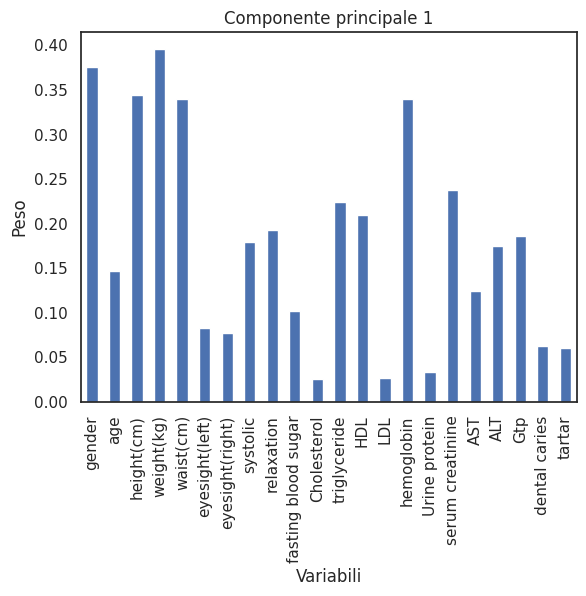

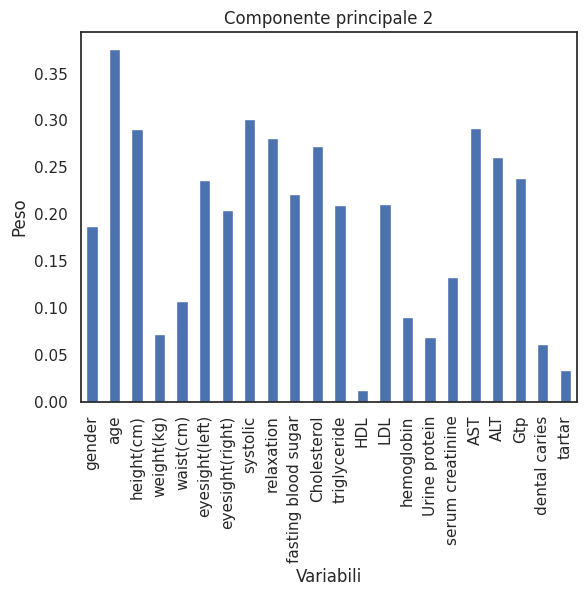

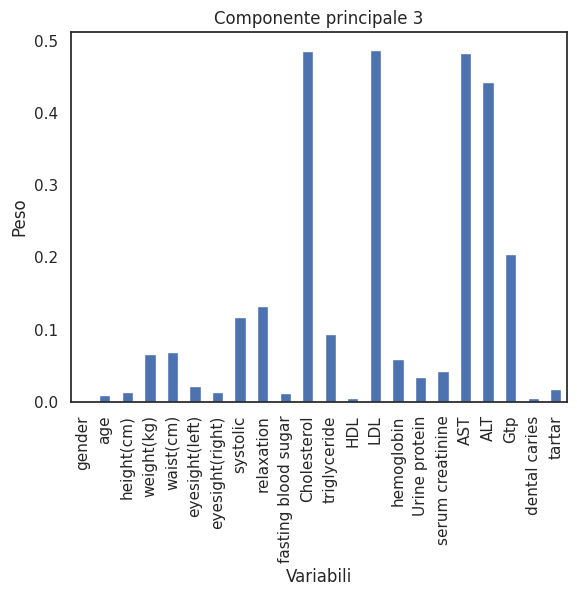

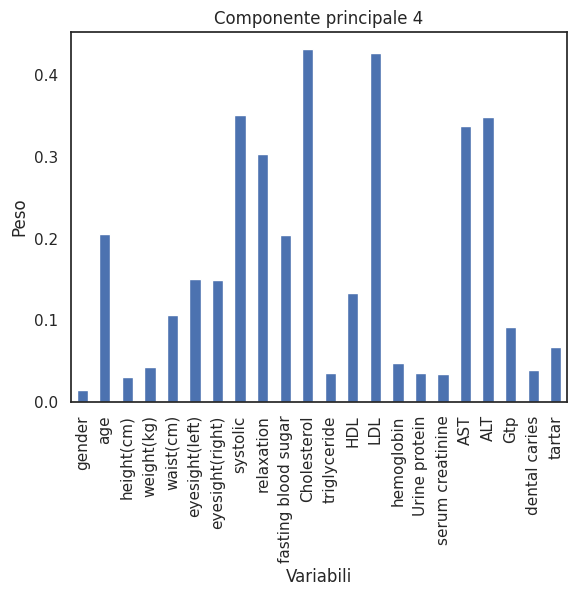

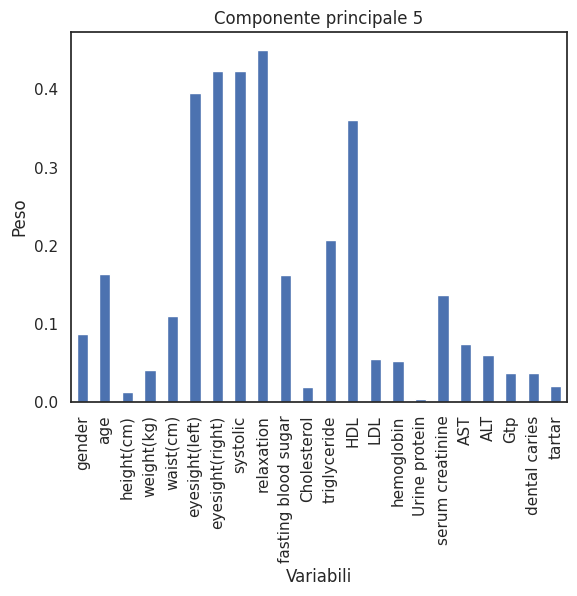

...

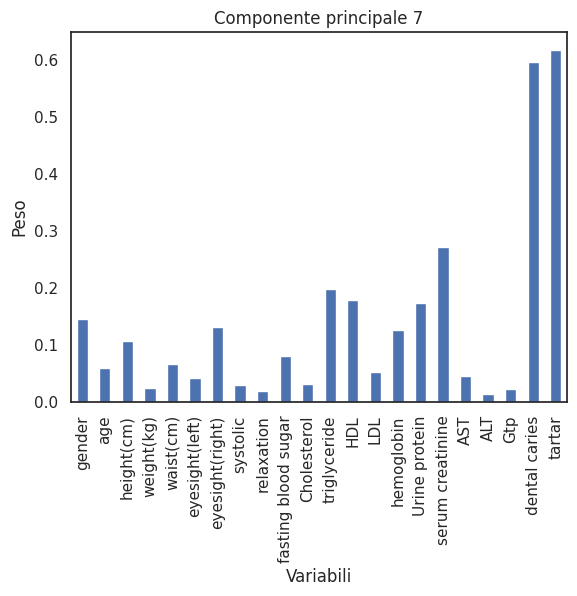

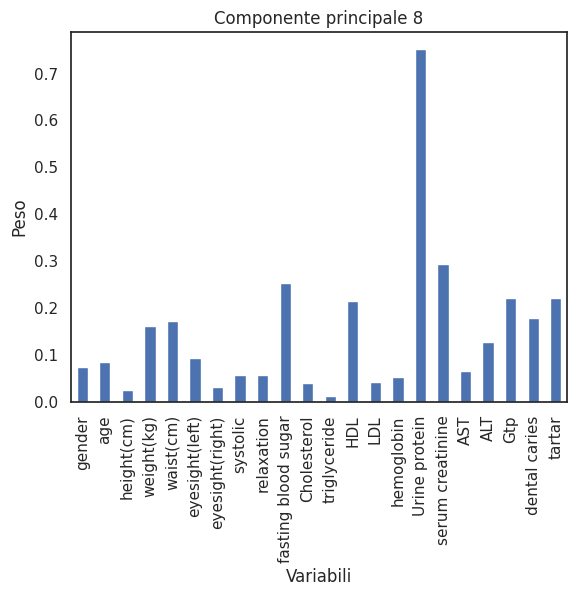

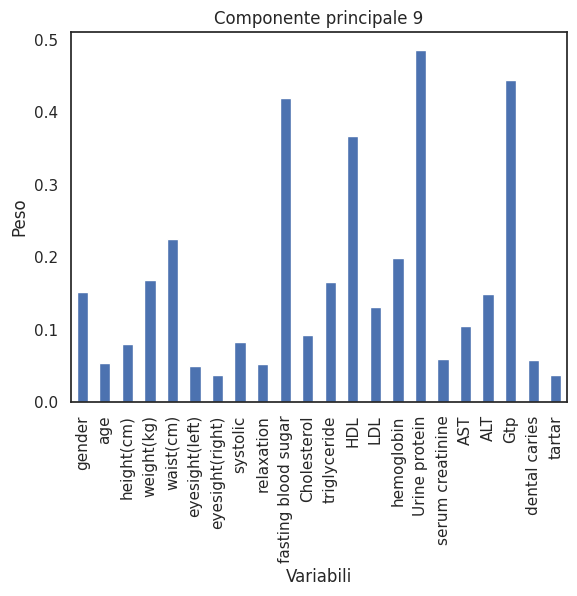

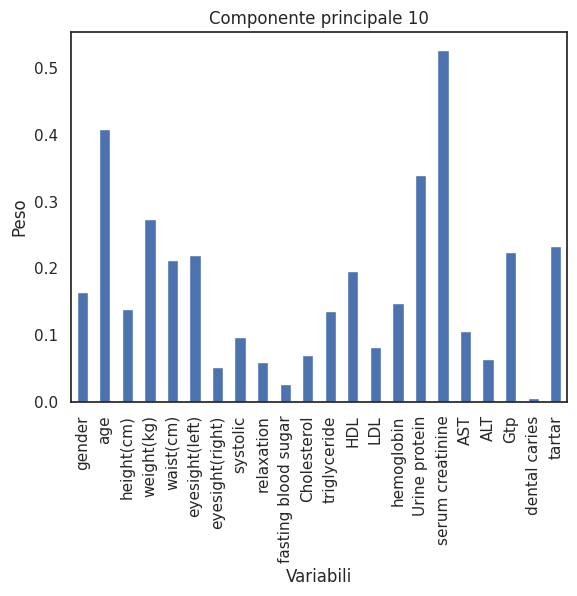

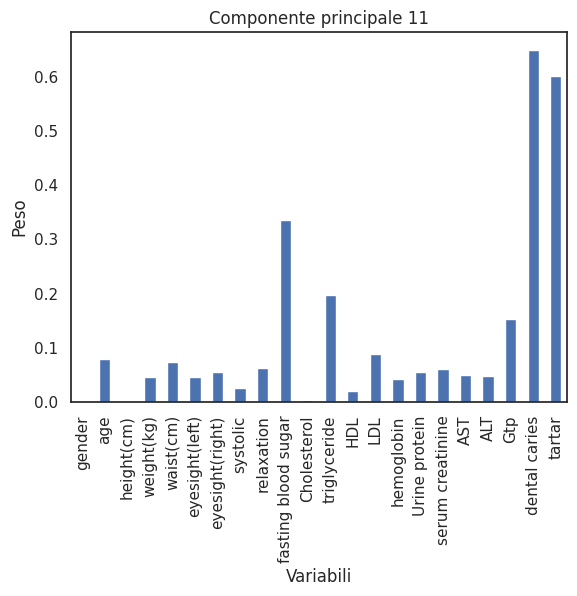

In [25]:
#Vediamo anche graficamente l'incidenza degli attributi
for i in range(11):
    ax = pca_df.iloc[i].plot(kind='bar')
    ax.set_xlabel('Variabili')
    ax.set_ylabel('Peso')
    ax.set_title('Componente principale {}'.format(i+1))
    plt.show()

In [26]:
#Creiamo un nuovo dataframe con le componenti principali
df_pca = pd.DataFrame(data = pca_data,
                      columns = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11'])

#Aggiungiamo la colonna target al nuovo dataframe
df_pca['target'] = df['smoking']

In [27]:
df_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,target
0,-2.185106,0.047930,-0.449249,0.710761,0.622411,0.132973,-0.638779,-0.108202,0.041991,-0.515108,-0.783379,0
1,-1.599655,0.707721,-0.061593,-0.436258,-1.123216,0.595151,-1.179643,-0.465355,0.121843,-0.565532,-0.402158,0
2,0.786253,1.154097,-1.768826,-0.275808,0.113940,-0.460486,1.517025,-0.440171,-0.161706,0.767430,0.023054,1
3,1.023758,-0.021242,-3.301963,3.866174,-1.552563,1.948056,-0.570070,-0.014263,0.077930,0.333685,-0.675079,0
4,-2.293783,-0.072376,0.069652,-0.397543,0.593038,0.455491,0.334743,-1.194372,0.720390,-1.256924,0.150890,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.523593,-1.875353,-0.669061,0.627703,0.801781,-1.768285,-1.082851,0.388805,-0.014843,-0.124901,0.461944,0
9996,2.242643,-1.963096,0.382535,0.049947,0.754561,0.851143,0.661931,-1.413334,0.382487,-1.731060,0.406048,1
9997,0.728213,-0.832919,1.040329,-1.441830,-2.616528,-0.264551,0.221823,0.451222,-0.333658,1.559274,-0.863737,1
9998,0.128979,-0.681276,-1.252948,0.566113,0.462258,0.015298,-0.270281,-0.336318,0.368920,0.560379,-1.124725,0


Abbiamo ottenuto un nuovo dataset con lo stesso numero di righe del precedente ma con sole 12 features al posto che 24.

## Modelli

Ora passiamo all'addestramento dei modelli. Abbiamo deciso di utilizzare due approcci distinti:

- gli alberi decisionali
- le reti neurali.

Valuteremo entrambi i modelli sia con l'applicazione di PCA che senza, al fine di determinare se la riduzione della dimensionalità porti a prestazioni migliori.

In [28]:
#Suddivdiamo il dataset in training set e test set (con test size del 30%)
from sklearn.model_selection import train_test_split

X = df.drop('smoking', axis=1)
y = df['smoking']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [29]:
from sklearn.model_selection import train_test_split

X = df_pca.drop('target', axis=1)
y = df_pca['target']

X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X, y, test_size=0.3, random_state=42)

Prima di addestrare i modelli, proviamo ad effettuare una previsione azzardata assegnando il valore 0 a tutte le istanze del test set:

In [33]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

# y_pred è un vettore di soli 1 (predizioni del modello di baseline)
y_pred = np.zeros(y_test_pca.shape)

cm = confusion_matrix(y_test_pca, y_pred)

print("Confusion matrix:\n", cm)

print("Test Set Performance:")
print(classification_report(y_test_pca, y_pred))

Confusion matrix:
 [[1941    0]
 [1059    0]]
Test Set Performance:
              precision    recall  f1-score   support

           0       0.65      1.00      0.79      1941
           1       0.00      0.00      0.00      1059

    accuracy                           0.65      3000
   macro avg       0.32      0.50      0.39      3000
weighted avg       0.42      0.65      0.51      3000



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [54]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

# y_pred è un vettore di soli 1 (predizioni del modello di baseline)
y_pred = np.ones(y_test.shape)  # Inizialmente impostato a tutti 1        & (X_test['weight(kg)'] < 80) & (X_test['hemoglobin'] < 15) & (X_test['waist(cm)'] < 95) & (X_test['triglyceride'] < 200) & (X_test['Gtp'] < 75) & (X_test['age'] > 35) & (X_test['HDL'] > 50))

# Impostare a 0 solo i casi in cui gender=0 e weight<80
indices_to_zero = np.where((X_test['gender'] == 0))
y_pred[indices_to_zero] = 0

cm = confusion_matrix(y_test, y_pred)

print("Confusion matrix:\n", cm)

print("Test Set Performance:")
print(classification_report(y_test_pca, y_pred))

Confusion matrix:
 [[1091  850]
 [  52 1007]]
Test Set Performance:
              precision    recall  f1-score   support

           0       0.95      0.56      0.71      1941
           1       0.54      0.95      0.69      1059

    accuracy                           0.70      3000
   macro avg       0.75      0.76      0.70      3000
weighted avg       0.81      0.70      0.70      3000



### Alberi di decisione

#### Albero di Decisione

Facciamo training albero

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from time import time

model_tree = DecisionTreeClassifier(random_state=42)
start_time = time()
model_tree.fit(X_train, y_train)
end_time = time()
DecisionTreeNoPCA_training_time = end_time - start_time

# Visualizza l'albero decisionale
fig, ax = plt.subplots(figsize=(150, 100))
plot_tree(model_tree, filled=True, ax=ax)
plt.plot()

[]

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# predizione del nuovo modello
y_pred = model_tree.predict(X_test)

cm = confusion_matrix(y_test, y_pred)

print("Confusion matrix:\n", cm)

print("Test Set Performance:")
print(classification_report(y_test, y_pred))

Confusion matrix:
 [[1447  494]
 [ 427  632]]
Test Set Performance:
              precision    recall  f1-score   support

           0       0.77      0.75      0.76      1941
           1       0.56      0.60      0.58      1059

    accuracy                           0.69      3000
   macro avg       0.67      0.67      0.67      3000
weighted avg       0.70      0.69      0.70      3000



In [ ]:
# andiamo a lavorare sul parametro di complessità, che stima il vantaggio di aggiungere/togliere degli split
# in funzione degli errori di classificazione
# più il modello è complesso e più viene penalizzato
path = model_tree.cost_complexity_pruning_path(X_train, y_train)

ccp_alphas = path.ccp_alphas

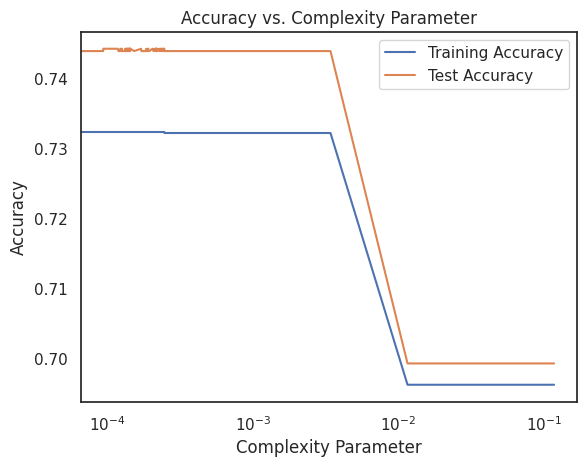

In [ ]:
# valori di complessità candidati ad essere tagliati dal modello
ccp_alphas = path.ccp_alphas

# Addestra l'albero decisionale con diversi valori di complessità
train_accuracy = []
test_accuracy = []
for complexity in ccp_alphas:
    clf = DecisionTreeClassifier(max_depth=3, ccp_alpha=complexity)
    clf.fit(X_train, y_train)
    train_accuracy.append(clf.score(X_train, y_train))
    test_accuracy.append(clf.score(X_test, y_test))

# Plotta l'accuratezza del modello in funzione del parametro di complessità
plt.plot(ccp_alphas, train_accuracy, label='Training Accuracy')
plt.plot(ccp_alphas, test_accuracy, label='Test Accuracy')
plt.xlabel('Complexity Parameter')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Complexity Parameter')
plt.xscale('log')
plt.legend()
plt.show()

In [ ]:
# Inizializzazione di una lista vuota per memorizzare i modelli addestrati
clfs = []

# Iterazione attraverso i valori alfa di complessità dei costi
for ccp_alpha in ccp_alphas:
     # Creazione e addestramento di un modello di albero decisionale con il valore alfa corrente
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.11735577440370953


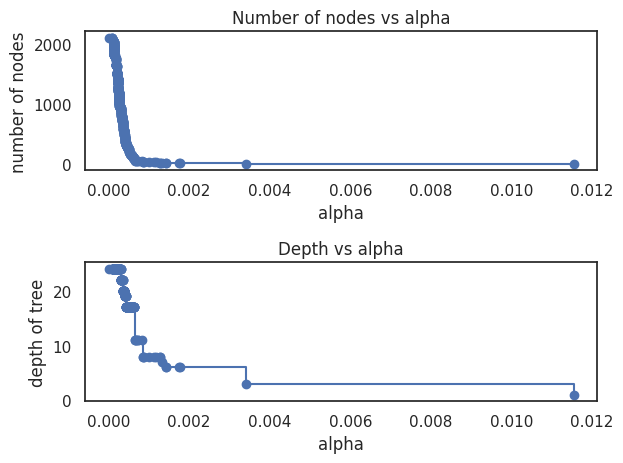

In [ ]:
# Rimozione dell'ultimo modello addestrato e del relativo valore alfa di complessità
clfs = clfs[:-1]
complexity_values = ccp_alphas[:-1]

# Estrazione del numero di nodi e della profondità per ciascun modello addestrato
node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]

fig, ax = plt.subplots(2, 1)

# Grafico del numero di nodi rispetto al valore alfa di complessità
ax[0].plot(complexity_values, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")

# Grafico della profondità dell'albero rispetto al valore alfa di complessità
ax[1].plot(complexity_values, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

In [ ]:
from sklearn.model_selection import GridSearchCV

decision_tree = DecisionTreeClassifier()

param_grid = {
    'max_depth': [3, 5, 7],
    'ccp_alpha': [0.0001, 0.0002, 0.0004, 0.0006, 0.0008, 0.001, 0.002, 0.004, 0.006, 0.008]
}

grid_search = GridSearchCV(estimator=decision_tree, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

best_params_pca = grid_search.best_params_
best_score_pca = grid_search.best_score_

print(best_params_pca)
print(best_score_pca)

{'ccp_alpha': 0.001, 'max_depth': 7}
0.7321428571428571


In [ ]:
# Potiamo albero con alpha=0.001
clf_pruned = DecisionTreeClassifier(max_depth=best_params_pca['max_depth'], ccp_alpha=best_params_pca['ccp_alpha'])
clf_pruned.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.001, max_depth=7)

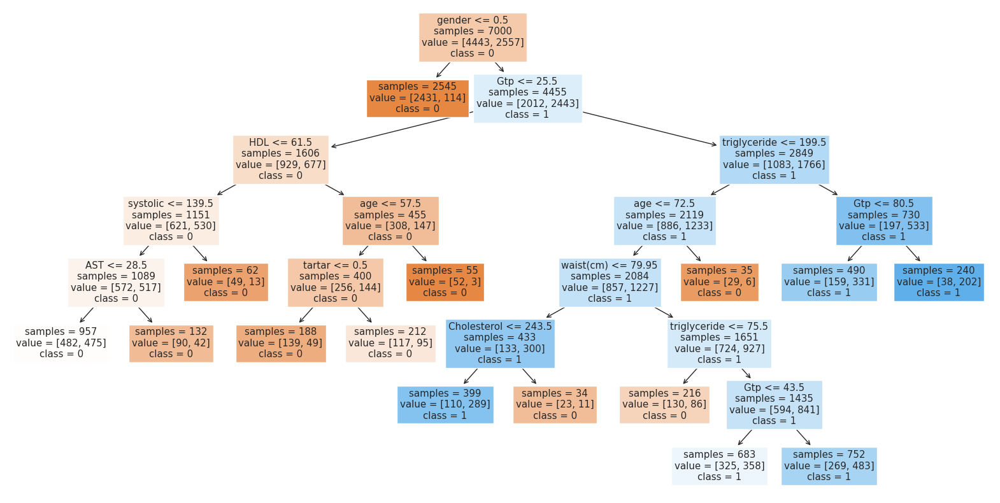

Test Set Performance:
              precision    recall  f1-score   support

           0       0.81      0.80      0.81      1941
           1       0.65      0.66      0.65      1059

    accuracy                           0.75      3000
   macro avg       0.73      0.73      0.73      3000
weighted avg       0.75      0.75      0.75      3000



In [ ]:
from sklearn.tree import plot_tree

fig, ax = plt.subplots(figsize=(20, 10))
plot_tree(clf_pruned,
          feature_names=X_train.columns,
          class_names=[str(x) for x in clf_pruned.classes_],
          filled=True,
          ax=ax,
          impurity=False)

plt.show()

y_pred = clf_pruned.predict(X_test)

cm_tree = confusion_matrix(y_test, y_pred)
accuracy_pruned = clf_pruned.score(X_test, y_test)

print("Test Set Performance:")
print(classification_report(y_test, y_pred))

<Axes: >

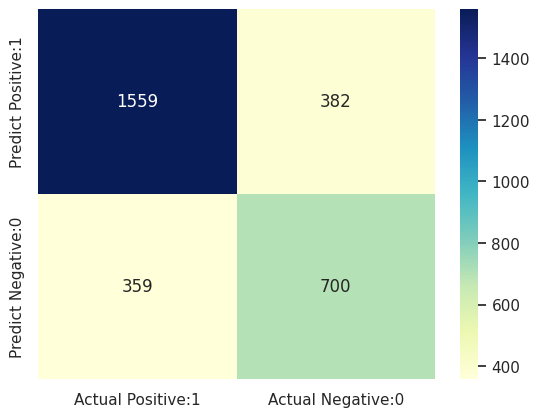

In [ ]:
import seaborn as sns

# Stampa matrice di confusione
cm_matrix = pd.DataFrame(data=cm_tree, columns=['Actual Positive:1', 'Actual Negative:0'],
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

#### Albero di decisione con PCA

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

tree_pca = DecisionTreeClassifier(random_state=42)
start_time = time()
tree_pca.fit(X_train_pca, y_train_pca)
end_time = time()
DecisionTreePCA_training_time = end_time - start_time

# Visualizza l'albero decisionale
fig, ax = plt.subplots(figsize=(150, 100))
plot_tree(tree_pca, filled=True, ax=ax)
plt.plot()

[]

In [ ]:
y_pred = tree_pca.predict(X_test_pca)

cm = confusion_matrix(y_test_pca, y_pred)
print("Confusion matrix:\n", cm)

print("Test Set Performance:")
print(classification_report(y_test_pca, y_pred))

Confusion matrix:
 [[1435  506]
 [ 466  593]]
Test Set Performance:
              precision    recall  f1-score   support

           0       0.75      0.74      0.75      1941
           1       0.54      0.56      0.55      1059

    accuracy                           0.68      3000
   macro avg       0.65      0.65      0.65      3000
weighted avg       0.68      0.68      0.68      3000



In [ ]:
path = tree_pca.cost_complexity_pruning_path(X_train_pca, y_train_pca)

ccp_alphas = path.ccp_alphas

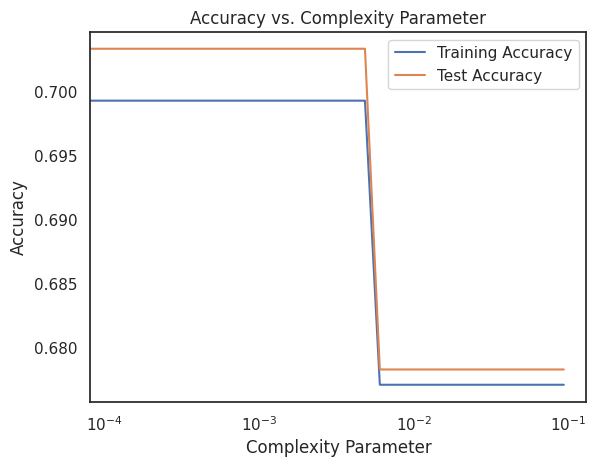

In [ ]:
ccp_alphas = path.ccp_alphas

# Addestra l'albero decisionale con diversi valori di complessità
train_accuracy = []
test_accuracy = []
for complexity in ccp_alphas:
    tree_pca = DecisionTreeClassifier(max_depth=3, ccp_alpha=complexity)
    tree_pca.fit(X_train_pca, y_train_pca)
    train_accuracy.append(tree_pca.score(X_train_pca, y_train_pca))
    test_accuracy.append(tree_pca.score(X_test_pca, y_test_pca))

# Plotta l'accuratezza del modello in funzione del parametro di complessità
plt.plot(ccp_alphas, train_accuracy, label='Training Accuracy')
plt.plot(ccp_alphas, test_accuracy, label='Test Accuracy')
plt.xlabel('Complexity Parameter')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Complexity Parameter')
plt.xscale('log')
plt.legend()
plt.show()

In [ ]:
clfs = []
for ccp_alpha in ccp_alphas:
    tree_pca = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    tree_pca.fit(X_train_pca, y_train_pca)
    clfs.append(tree_pca)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 3 with ccp_alpha: 0.09326631136980468


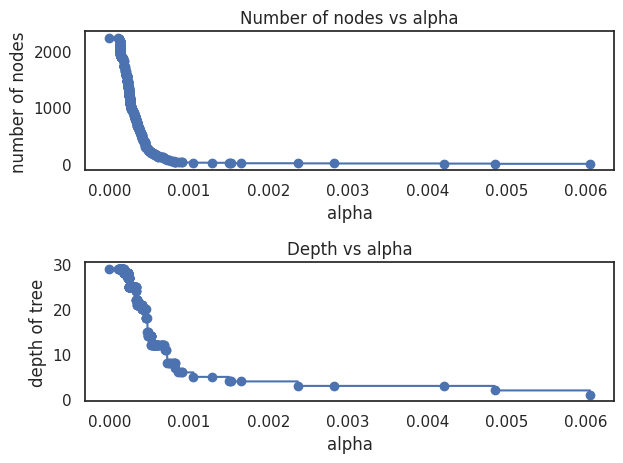

In [ ]:
clfs = clfs[:-1]
complexity_values = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(complexity_values, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(complexity_values, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

In [ ]:
from sklearn.model_selection import GridSearchCV

decision_tree = DecisionTreeClassifier()

param_grid = {
    'max_depth': [3, 5, 7],
    'ccp_alpha': [0.0001, 0.0002, 0.0004, 0.0006, 0.0008, 0.001, 0.002, 0.004, 0.006, 0.008]
}

grid_search = GridSearchCV(estimator=decision_tree, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(best_params)
print(best_score)

{'ccp_alpha': 0.001, 'max_depth': 7}
0.7321428571428571


In [ ]:
# Potiamo albero con alpha=0.001
tree_pca = DecisionTreeClassifier(max_depth=best_params['max_depth'], ccp_alpha=best_params['ccp_alpha'])
tree_pca.fit(X_train_pca, y_train_pca)

DecisionTreeClassifier(ccp_alpha=0.001, max_depth=7)

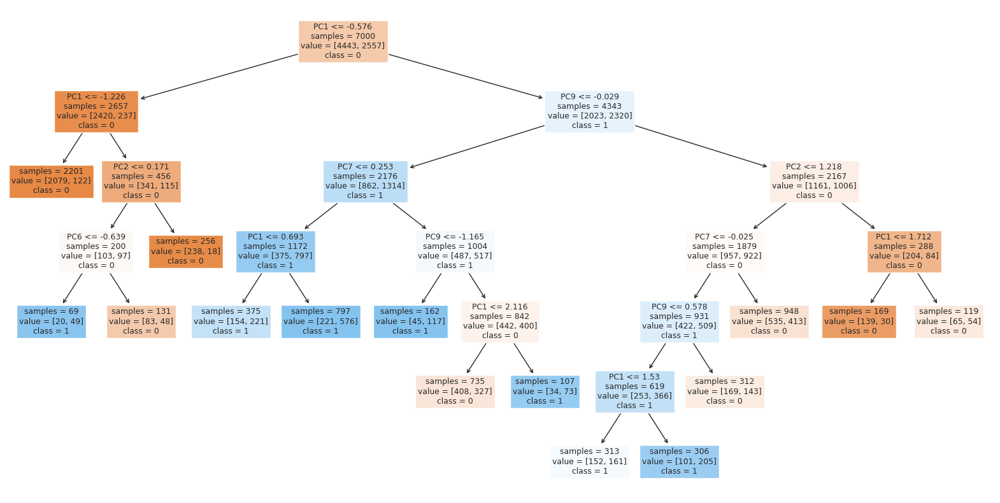

Test Set Performance:
              precision    recall  f1-score   support

           0       0.76      0.83      0.79      1941
           1       0.63      0.52      0.57      1059

    accuracy                           0.72      3000
   macro avg       0.69      0.68      0.68      3000
weighted avg       0.71      0.72      0.71      3000



In [ ]:
from sklearn.tree import plot_tree

fig, ax = plt.subplots(figsize=(20, 10))
plot_tree(tree_pca,
          feature_names=X_train_pca.columns,
          class_names=[str(x) for x in tree_pca.classes_],
          filled=True,
          ax=ax,
          impurity=False)

plt.show()

y_pred = tree_pca.predict(X_test_pca)

cm_tree_pca = confusion_matrix(y_test_pca, y_pred)

print("Test Set Performance:")
print(classification_report(y_test_pca, y_pred))

<Axes: >

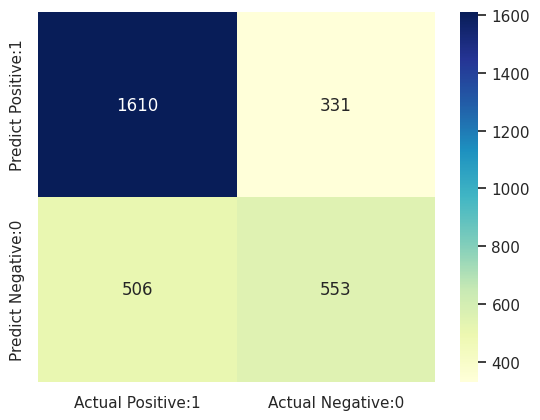

In [ ]:
import seaborn as sns

cm_matrix = pd.DataFrame(data=cm_tree_pca, columns=['Actual Positive:1', 'Actual Negative:0'],
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

#### Confronto tra i due alberi

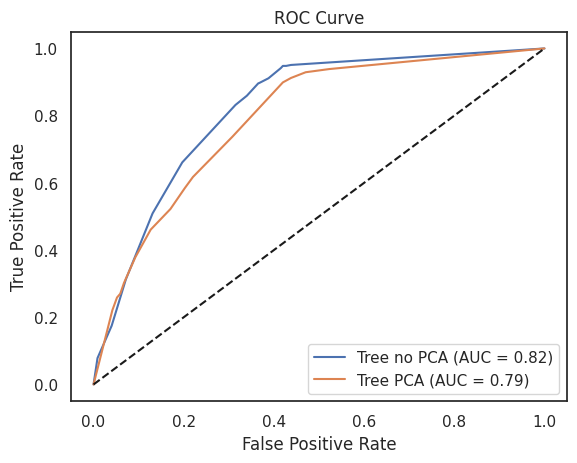

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score

# Calcola le probabilità predette per la classe positiva
y_pred_prob_tree = clf_pruned.predict_proba(X_test)[:, 1]
y_pred_prob_tree_pca = tree_pca.predict_proba(X_test_pca)[:,-1]

# Calcola la curva ROC e l'AUC di albero senza PCA
fpr_tree, tpr_tree, thresholds_tree = roc_curve(y_test, y_pred_prob_tree)
auc_tree = roc_auc_score(y_test, y_pred_prob_tree)

# Calcola la curva ROC e l'AUC di albero con PCA
fpr_tree_pca, tpr_tree_pca, thresholds_tree_pca = roc_curve(y_test_pca, y_pred_prob_tree_pca)
auc_tree_pca = roc_auc_score(y_test_pca, y_pred_prob_tree_pca)

# Plotta la curva ROC dei due modelli per comparare le performance
plt.plot(fpr_tree, tpr_tree, label=f'Tree no PCA (AUC = {auc_tree:.2f})')
plt.plot(fpr_tree_pca, tpr_tree_pca, label=f'Tree PCA (AUC = {auc_tree_pca:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [ ]:
# Tempi di training degli alberi non potati
print(f'Tempo di training DecisionTree no PCA: {DecisionTreeNoPCA_training_time:.3f} secondi')
print(f'Tempo di training DecisionTree con PCA: {DecisionTreePCA_training_time:.3f} secondi')

Tempo di training DecisionTree no PCA: 0.090 secondi
Tempo di training DecisionTree con PCA: 0.156 secondi


###Neural Network

####NN senza PCA

In [ ]:
X_train.shape

(7000, 22)

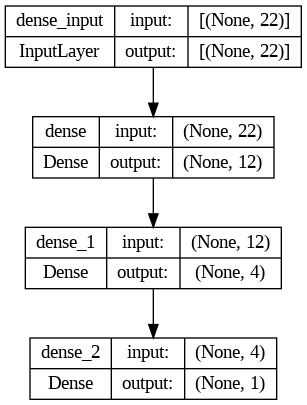

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from time import time
from sklearn.metrics import classification_report, confusion_matrix

# Costruzione delle rete neurale
nn_model = Sequential()
nn_model.add(Dense(12, input_shape=(22,), activation='relu'))
nn_model.add(Dense(4, activation='relu'))
nn_model.add(Dense(1, activation='sigmoid'))

# Compile the model
nn_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

keras.utils.plot_model(nn_model, show_shapes=True)

In [ ]:
# Addestramento del modello
start_time = time()
nn_model.fit(X_train, y_train, epochs=10, batch_size=10, verbose=1, validation_data=(X_test, y_test))
end_time = time()
NN_training_time = end_time - start_time

# Valutazione del modello sul test set
score = nn_model.evaluate(X_test, y_test, verbose=0)

print('Test loss:', score[0])
print('Test precision:', score[1])

Epoch 1/10
700/700 [==============================] - 3s 3ms/step - loss: 1.2364 - accuracy: 0.6581 - val_loss: 0.7030 - val_accuracy: 0.7043
Epoch 2/10
700/700 [==============================] - 2s 3ms/step - loss: 0.7021 - accuracy: 0.6830 - val_loss: 0.5834 - val_accuracy: 0.7283
Epoch 3/10
700/700 [==============================] - 2s 2ms/step - loss: 0.6593 - accuracy: 0.6859 - val_loss: 0.6237 - val_accuracy: 0.7077
Epoch 4/10
700/700 [==============================] - 2s 3ms/step - loss: 0.6407 - accuracy: 0.6910 - val_loss: 0.5630 - val_accuracy: 0.7153
Epoch 5/10
700/700 [==============================] - 2s 3ms/step - loss: 0.6239 - accuracy: 0.6966 - val_loss: 0.5475 - val_accuracy: 0.7380
Epoch 6/10
700/700 [==============================] - 2s 3ms/step - loss: 0.5879 - accuracy: 0.7016 - val_loss: 0.5041 - val_accuracy: 0.7387
Epoch 7/10
700/700 [==============================] - 2s 3ms/step - loss: 0.5727 - accuracy: 0.7094 - val_loss: 0.5310 - val_accuracy: 0.7403
Epoch 

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# Fai le predizioni sul test set
y_pred = nn_model.predict(X_test)
y_pred_binary = np.round(y_pred)

# Calcola la matrice di confusione
cm = confusion_matrix(y_test, y_pred_binary)

# Stampa classification report
print("Test Set Performance:")
print(classification_report(y_test, y_pred_binary))

94/94 [==============================] - 0s 1ms/step
Test Set Performance:
              precision    recall  f1-score   support

           0       0.87      0.74      0.80      1941
           1       0.63      0.79      0.70      1059

    accuracy                           0.76      3000
   macro avg       0.75      0.77      0.75      3000
weighted avg       0.78      0.76      0.76      3000



<Axes: >

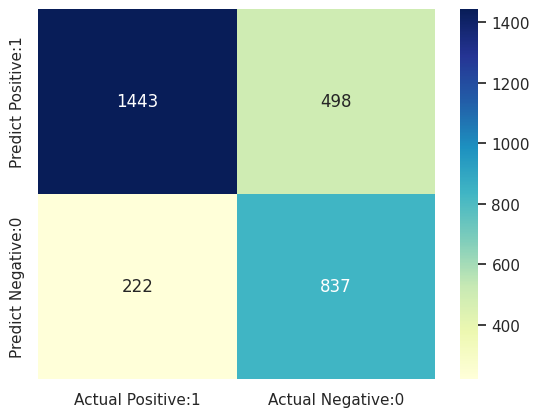

In [ ]:
import seaborn as sns

cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'],
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

####NN con PCA

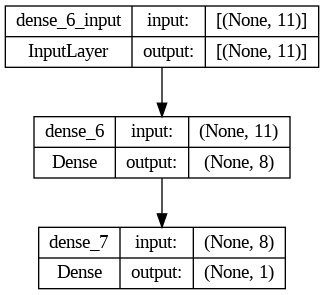

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense

#Costruzione della rete neurale
nnpca_model = Sequential()
nnpca_model.add(Dense(8, input_shape=(11,), activation='relu'))
nnpca_model.add(Dense(1, activation='sigmoid'))

# Compile the model
nnpca_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

keras.utils.plot_model(nnpca_model, show_shapes=True)

In [ ]:
# Addestramento del modello
start_time = time()
nnpca_model.fit(X_train_pca, y_train_pca, epochs=50, batch_size=10, verbose=1, validation_data=(X_test_pca, y_test_pca))
end_time = time()
NNPCA_training_time = end_time - start_time

# Valutazione sul test set
score = nnpca_model.evaluate(X_test_pca, y_test_pca, verbose=0)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

Epoch 1/50
700/700 [==============================] - 2s 3ms/step - loss: 0.6078 - accuracy: 0.6583 - val_loss: 0.5139 - val_accuracy: 0.7233
Epoch 2/50
700/700 [==============================] - 1s 2ms/step - loss: 0.5096 - accuracy: 0.7123 - val_loss: 0.4865 - val_accuracy: 0.7307
Epoch 3/50
700/700 [==============================] - 2s 3ms/step - loss: 0.4966 - accuracy: 0.7219 - val_loss: 0.4819 - val_accuracy: 0.7357
Epoch 4/50
700/700 [==============================] - 2s 3ms/step - loss: 0.4925 - accuracy: 0.7284 - val_loss: 0.4794 - val_accuracy: 0.7390
Epoch 5/50
700/700 [==============================] - 2s 3ms/step - loss: 0.4900 - accuracy: 0.7274 - val_loss: 0.4784 - val_accuracy: 0.7400
Epoch 6/50
700/700 [==============================] - 2s 2ms/step - loss: 0.4883 - accuracy: 0.7316 - val_loss: 0.4776 - val_accuracy: 0.7417
Epoch 7/50
700/700 [==============================] - 1s 2ms/step - loss: 0.4872 - accuracy: 0.7320 - val_loss: 0.4768 - val_accuracy: 0.7423
Epoch 

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# Fai le predizioni sul set di test
y_pred = nnpca_model.predict(X_test_pca)
y_pred_binary = np.round(y_pred)

# Calcola la matrice di confusione
cm = confusion_matrix(y_test_pca, y_pred_binary)

# Stampa classification report
print("Test Set Performance:")
print(classification_report(y_test_pca, y_pred_binary))

94/94 [==============================] - 0s 1ms/step
Test Set Performance:
              precision    recall  f1-score   support

           0       0.84      0.76      0.80      1941
           1       0.62      0.73      0.67      1059

    accuracy                           0.75      3000
   macro avg       0.73      0.74      0.73      3000
weighted avg       0.76      0.75      0.75      3000



<Axes: >

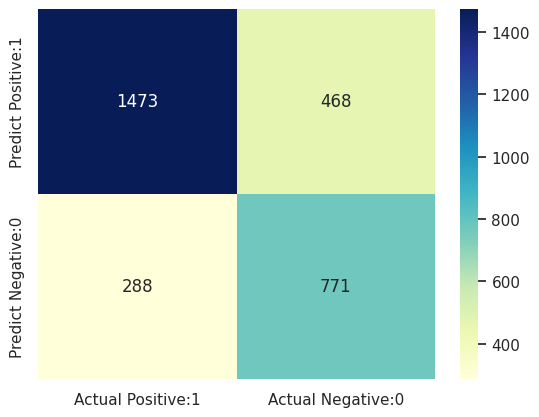

In [ ]:
import seaborn as sns

# Stampa matrice di confusione
cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'],
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

####Confronto tra i due modelli di Neural Network

94/94 [==============================] - 0s 2ms/step


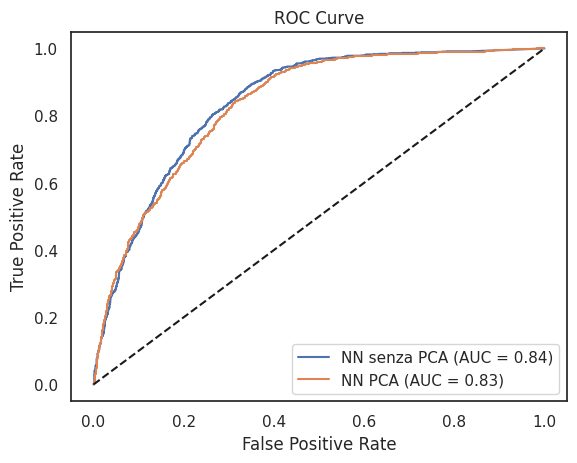

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Calcola le probabilità di predizione per entrambi i modelli
y_pred_prob = nn_model.predict(X_test)
y_pred_prob_pca = nnpca_model.predict(X_test_pca)

# Calcola i valori necessari per la costruzione della curva ROC per entrambi i modelli
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
auc = roc_auc_score(y_test, y_pred_prob)

fpr_pca, tpr_pca, thresholds_pca = roc_curve(y_test_pca, y_pred_prob_pca)
auc_pca = roc_auc_score(y_test_pca, y_pred_prob_pca)

# Plotta la curva ROC dei due modelli per comparare le performance
plt.plot(fpr, tpr, label=f'NN senza PCA (AUC = {auc:.2f})')
plt.plot(fpr_pca, tpr_pca, label=f'NN PCA (AUC = {auc_pca:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [ ]:
print(f'Tempo di training NN senza PCA: {NN_training_time:.3f} secondi')
print(f'Tempo di training NN con PCA: {NNPCA_training_time:.3f} secondi')

Tempo di training NN senza PCA: 142.716 secondi
Tempo di training NN con PCA: 142.535 secondi


##Stratified Cross Validation

Facciamo ora la cross-validation per tutti e quattro i modelli. Abbiamo scelto di utilizzare stratified cross-validation poiché le classi dell'attributo "smoking" sono sbilanciate.

In [ ]:
from sklearn.model_selection import KFold,StratifiedKFold
# Numero di fold desiderati per la cross-validation
n_fold = 10

folds = StratifiedKFold(n_splits=n_fold, shuffle=True)

In [ ]:
# Impostiamo come target l'attributo 'smoking' per i modelli che usano il dataset originale
y=df['smoking']
df = df.drop('smoking', axis=1)

In [ ]:
# Impostiamo come target l'attributo 'target' (uguale a 'smoking') per i modelli che usano il nuovo dataset ottenuto a seguito della PCA
y_pca=df_pca['target']
df_pca = df_pca.drop('target', axis=1)

###Decision tree No PCA

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score
import scipy.stats as st
import numpy as np
from time import time

In [ ]:
# Inizializzaziamo alcuni array per salvare i risultati della cross-validation
accuracy_stratified_tree = []
mean_interpolated_tpr_tree = []
mean_interpolated_fpr_tree = []
mean_auc_tree = []

# Vogliamo calcolare una matrice di confusione totale alla fine della CV, quindi partiamo inizializzando una matrice con 4 valori a 0
# Ad ogni iterazione questa matrice viene aggiornata con i nuovi valori delle predizioni
confusion_matrix_total_tree = np.zeros((2,2))

start_time = time()
# Loop attraverso i fold generati dalla cross-validation
for n_fold, (train_idx, valid_idx) in enumerate(folds.split(df, y)):
    # Suddivisione dei dati in training set e validation set
    X_train_tree, X_valid_tree = df.iloc[train_idx], df.iloc[valid_idx]
    y_train_tree, y_valid_tree = y[train_idx], y[valid_idx]

    # Inizializzazione e addestramento dell'albero decisionale
    tree = DecisionTreeClassifier(max_depth=best_params['max_depth'], ccp_alpha=best_params['ccp_alpha'], random_state=42)
    tree.fit(X_train_tree, y_train_tree)

    # Predizione delle classi sul validation set
    y_pred_valid_tree = tree.predict(X_valid_tree)

    # Aggiornamento matrice di confusione totale
    confusion_matrix_fold = confusion_matrix(y_valid_tree, y_pred_valid_tree)
    confusion_matrix_total_tree += confusion_matrix_fold

    # Calcolo e salvataggio dell'accuratezza per questo fold
    accuracy_stratified_tree.append(accuracy_score(y_valid_tree, y_pred_valid_tree))

    # Calcolo della curva ROC e dell'AUC per il modello su questo fold
    fpr_tree, tpr_tree, thresholds_tree = roc_curve(y_valid_tree, y_pred_valid_tree)
    auc_tree = roc_auc_score(y_valid_tree, y_pred_valid_tree)

    # Interpolazione dei valori TPR e FPR per avere valori interpolati su una griglia comune
    # I dati calcolati ad ogni iterazione vengono aggiunti a degli array così da calcolare la media a fine CV
    common_fpr = np.linspace(0, 1, 100)
    interpolated_tpr_tree = np.interp(common_fpr, fpr_tree, tpr_tree)
    mean_interpolated_tpr_tree.append(interpolated_tpr_tree)
    mean_interpolated_fpr_tree.append(common_fpr)
    mean_auc_tree.append(auc_tree)

end_time = time()
cv_time_decisiontree = end_time - start_time

# Calcola la media dei valori interpolati dei valori necessari alla costruzione della curva ROC
mean_interpolated_tpr_tree = np.mean(mean_interpolated_tpr_tree, axis=0)
mean_interpolated_fpr_tree = np.mean(mean_interpolated_fpr_tree, axis=0)
mean_auc_tree = np.mean(mean_auc_tree)

In [ ]:
# Stampiamo i vari valori di accuratezza ottenuti per ogni fold
accuracy_stratified_tree

[0.749, 0.738, 0.741, 0.742, 0.734]

In [ ]:
# Utilizza la funzione st.t.interval per calcolare l'intervallo di confidenza del 90% per la media del campione di dati accuracy_stratified_tree
interval_tree = st.t.interval(confidence=0.90, df=len(accuracy_stratified_tree)-1, loc=np.mean(accuracy_stratified_tree), scale=st.sem(accuracy_stratified_tree))
interval_tree

(0.7355174918748348, 0.7460825081251652)

Otteniamo così un intervallo di confidenza per il valore medio di accuratezza del modello, indicando che con una confidenza del 90%, il valore medio si trova compreso tra i due limiti definiti dall'intervallo.

###Decision Tree con PCA

Eseguiamo le stesse operazioni della cross-validation fatte per il modello senza PCA, utilizzando però il dataset ottenuto a seguito della PCA anziché il dataset originale.

In [ ]:
# Inizializzaziamo alcuni array per salvare i risultati della cross-validation
accuracy_stratified_tree_pca = []
mean_interpolated_tpr_tree_pca = []
mean_interpolated_fpr_tree_pca = []
mean_auc_tree_pca = []

confusion_matrix_total_tree_pca = np.zeros((2,2))

start_time = time()
for n_fold, (train_idx, valid_idx) in enumerate(folds.split(df_pca, y_pca)):
    X_train_tree, X_valid_tree = df_pca.iloc[train_idx], df_pca.iloc[valid_idx]
    y_train_tree, y_valid_tree = y_pca[train_idx], y_pca[valid_idx]

    # Inizializzazione e addestramento dell'albero decisionale
    tree = DecisionTreeClassifier(max_depth=best_params_pca['max_depth'], ccp_alpha=best_params_pca['ccp_alpha'], random_state=42)
    tree.fit(X_train_tree, y_train_tree)

    # Predizione delle classi sul validation set
    y_pred_valid_tree = tree.predict(X_valid_tree)

    confusion_matrix_fold = confusion_matrix(y_valid_tree, y_pred_valid_tree)
    confusion_matrix_total_tree_pca += confusion_matrix_fold

    # Calcolo della curva ROC e dell'AUC per il modello su questo fold
    fpr_tree_pca, tpr_tree_pca, thresholds_tree_pca = roc_curve(y_valid_tree, y_pred_valid_tree)
    auc_tree_pca = roc_auc_score(y_valid_tree, y_pred_valid_tree)

    # Interpolazione dei valori TPR e FPR per avere valori interpolati su una griglia comune
    # I dati calcolati ad ogni iterazione vengono aggiunti a degli array così da calcolare la media a fine CV    common_fpr = np.linspace(0, 1, 100)
    interpolated_tpr_tree_pca = np.interp(common_fpr, fpr_tree_pca, tpr_tree_pca)
    mean_interpolated_tpr_tree_pca.append(interpolated_tpr_tree_pca)
    mean_interpolated_fpr_tree_pca.append(common_fpr)
    mean_auc_tree_pca.append(auc_tree_pca)

    accuracy_stratified_tree_pca.append(accuracy_score(y_valid_tree, y_pred_valid_tree))

end_time = time()
cv_time_decisiontree_pca = end_time - start_time

# Calcola la media dei valori interpolati dei valori necessari alla costruzione della curva ROC
mean_interpolated_tpr_tree_pca = np.mean(mean_interpolated_tpr_tree_pca, axis=0)
mean_interpolated_fpr_tree_pca = np.mean(mean_interpolated_fpr_tree_pca, axis=0)
mean_auc_tree_pca = np.mean(mean_auc_tree_pca)


In [ ]:
# Stampiamo i vari valori di accuratezza ottenuti per ogni fold
accuracy_stratified_tree_pca

[0.7005, 0.705, 0.7065, 0.7105, 0.698]

In [ ]:
# Utilizza la funzione st.t.interval per calcolare l'intervallo di confidenza del 90% per la media del campione di dati accuracy_stratified_tree
interval_tree_pca = st.t.interval(confidence=0.90, df=len(accuracy_stratified_tree_pca)-1, loc=np.mean(accuracy_stratified_tree_pca), scale=st.sem(accuracy_stratified_tree_pca))
interval_tree_pca

(0.6993881845467937, 0.7088118154532064)

###Neural Network senza PCA

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import roc_curve, roc_auc_score
from time import time
from sklearn.metrics import accuracy_score
import scipy.stats as st


# Inizializzaziamo alcuni array per salvare i risultati della cross-validation
accuracy_stratified_nn = []
confusion_matrix_total_nn = np.zeros((2,2))
mean_interpolated_tpr_nn = []
mean_interpolated_fpr_nn = []
mean_auc_nn = []

start_time = time()

for n_fold, (train_idx, valid_idx) in enumerate(folds.split(df, y)):
    X_train_nn, X_valid_nn = df.iloc[train_idx], df.iloc[valid_idx]
    y_train_nn, y_valid_nn = y[train_idx], y[valid_idx]

    # Costruzione e addestramento della NN
    nn = Sequential()
    nn.add(Dense(14, input_shape=(22,), activation='relu')) #originale aveva 22-12-4-1 con relu
    nn.add(Dense(6, activation='tanh'))
    nn.add(Dense(4, activation='tanh'))
    nn.add(Dense(1, activation='sigmoid'))

    nn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    nn.fit(X_train_nn, y_train_nn, epochs=10, batch_size=10, verbose=1, validation_data=(X_valid_nn, y_valid_nn))

    # Predizione delle classi sul validation set
    y_pred_valid_nn = nn.predict(X_valid_nn)
    y_prediction = np.round(y_pred_valid_nn)

    confusion_matrix_fold = confusion_matrix(y_valid_nn, y_prediction)
    confusion_matrix_total_nn += confusion_matrix_fold

    # Calcolo della curva ROC e dell'AUC per la rete neurale addestrata in questo fold
    fpr_nn, tpr_nn, thresholds_nn = roc_curve(y_valid_nn, y_pred_valid_nn)
    auc_nn = roc_auc_score(y_valid_nn, y_pred_valid_nn)

    # Interpolazione dei valori TPR e FPR per avere valori interpolati su una griglia comune
    common_fpr = np.linspace(0, 1, 100)
    interpolated_tpr_nn = np.interp(common_fpr, fpr_nn, tpr_nn)
    mean_interpolated_tpr_nn.append(interpolated_tpr_nn)
    mean_interpolated_fpr_nn.append(common_fpr)
    mean_auc_nn.append(auc_nn)

    # Calcolo e salvataggio dell'accuratezza per questo fold
    accuracy = accuracy_score(y_valid_nn, y_prediction)
    accuracy_stratified_nn.append(accuracy)

end_time = time()
cv_time_nn = end_time - start_time

# Calcola la media dei valori interpolati dei valori necessari alla costruzione della curva ROC
mean_interpolated_tpr_nn = np.mean(mean_interpolated_tpr_nn, axis=0)
mean_interpolated_fpr_nn = np.mean(mean_interpolated_fpr_nn, axis=0)
mean_auc_nn = np.mean(mean_auc_nn)

Epoch 1/10
900/900 [==============================] - 6s 5ms/step - loss: 0.6321 - accuracy: 0.6468 - val_loss: 0.6362 - val_accuracy: 0.6760
Epoch 2/10
900/900 [==============================] - 4s 4ms/step - loss: 0.5977 - accuracy: 0.6759 - val_loss: 0.5767 - val_accuracy: 0.6440
Epoch 3/10
900/900 [==============================] - 5s 6ms/step - loss: 0.5888 - accuracy: 0.6718 - val_loss: 0.5753 - val_accuracy: 0.6470
Epoch 4/10
900/900 [==============================] - 2s 2ms/step - loss: 0.5859 - accuracy: 0.6724 - val_loss: 0.5888 - val_accuracy: 0.6350
Epoch 5/10
900/900 [==============================] - 2s 2ms/step - loss: 0.5730 - accuracy: 0.6790 - val_loss: 0.5761 - val_accuracy: 0.6590
Epoch 6/10
900/900 [==============================] - 2s 2ms/step - loss: 0.5688 - accuracy: 0.6884 - val_loss: 0.5959 - val_accuracy: 0.7130
Epoch 7/10
900/900 [==============================] - 2s 2ms/step - loss: 0.5683 - accuracy: 0.6899 - val_loss: 0.5579 - val_accuracy: 0.6990
Epoch 

In [ ]:
accuracy_stratified_nn

[0.717, 0.681, 0.639, 0.694, 0.673, 0.638, 0.726, 0.689, 0.685, 0.66]

In [ ]:
interval_nn = st.t.interval(confidence=0.90, df=len(accuracy_stratified_nn)-1, loc=np.mean(accuracy_stratified_nn), scale=st.sem(accuracy_stratified_nn))
interval_nn

(0.663264664256158, 0.6971353357438418)

###Neural Network con PCA

In [ ]:
# Inizializzaziamo alcuni array per salvare i risultati della cross-validation
accuracy_stratified_nn_pca = []
mean_interpolated_tpr_nn_pca = []
mean_interpolated_fpr_nn_pca = []
mean_auc_nn_pca = []

confusion_matrix_total_nn_pca = np.zeros((2,2))

start_time = time()
for n_fold, (train_idx, valid_idx) in enumerate(folds.split(df_pca, y_pca)):
        X_train_nn_pca, X_valid_nn_pca = df_pca.iloc[train_idx], df_pca.iloc[valid_idx]
        y_train_nn_pca, y_valid_nn_pca = y_pca[train_idx], y_pca[valid_idx]

        # Costruzione e addestramento della NN con PCA
        nn_pca = Sequential()
        nn_pca.add(Dense(8, input_shape=(11,), activation='relu'))
        nn_pca.add(Dense(1, activation='sigmoid'))

        nn_pca.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

        nn_pca.fit(X_train_nn_pca, y_train_nn_pca, epochs=50, batch_size=10, verbose=1, validation_data=(X_valid_nn_pca, y_valid_nn_pca))

        # Predizione delle classi sul validation set
        y_pred_valid_nn_pca = nn_pca.predict(X_valid_nn_pca)
        y_prediction = np.round(y_pred_valid_nn_pca)

        confusion_matrix_fold = confusion_matrix(y_valid_nn_pca, y_prediction)
        confusion_matrix_total_nn_pca += confusion_matrix_fold

        # Calcolo e salvataggio dell'accuratezza per questo fold
        accuracy_pca = accuracy_score(y_valid_nn_pca, y_prediction)
        accuracy_stratified_nn.append(accuracy_pca)

        # Calcolo della curva ROC e dell'AUC per la rete neurale addestrata in questo fold
        fpr_nn_pca, tpr_nn_pca, thresholds_nn_pca = roc_curve(y_valid_nn_pca, y_pred_valid_nn_pca)
        auc_nn_pca = roc_auc_score(y_valid_nn_pca, y_pred_valid_nn_pca)

        # Interpolazione dei valori TPR e FPR per avere valori interpolati su una griglia comune
        common_fpr_pca = np.linspace(0, 1, 100)
        interpolated_tpr_nn_pca = np.interp(common_fpr_pca, fpr_nn_pca, tpr_nn_pca)
        mean_interpolated_tpr_nn_pca.append(interpolated_tpr_nn_pca)
        mean_interpolated_fpr_nn_pca.append(common_fpr_pca)
        mean_auc_nn_pca.append(auc_nn_pca)

        accuracy = accuracy_score(y_valid_nn_pca, y_prediction)
        accuracy_stratified_nn_pca.append(accuracy)
end_time = time()
cv_time_nn_pca = end_time - start_time

# Calcola la media dei valori interpolati dei valori necessari alla costruzione della curva ROC
mean_interpolated_tpr_nn_pca = np.mean(mean_interpolated_tpr_nn_pca, axis=0)
mean_interpolated_fpr_nn_pca = np.mean(mean_interpolated_fpr_nn_pca, axis=0)
mean_auc_nn_pca = np.mean(mean_auc_nn_pca)


Epoch 1/50
800/800 [==============================] - 2s 2ms/step - loss: 0.5442 - accuracy: 0.6873 - val_loss: 0.5230 - val_accuracy: 0.6990
Epoch 2/50
800/800 [==============================] - 2s 3ms/step - loss: 0.4967 - accuracy: 0.7193 - val_loss: 0.5100 - val_accuracy: 0.7125
Epoch 3/50
800/800 [==============================] - 2s 3ms/step - loss: 0.4885 - accuracy: 0.7280 - val_loss: 0.5041 - val_accuracy: 0.7165
Epoch 4/50
800/800 [==============================] - 1s 2ms/step - loss: 0.4843 - accuracy: 0.7312 - val_loss: 0.5033 - val_accuracy: 0.7205
Epoch 5/50
800/800 [==============================] - 2s 2ms/step - loss: 0.4817 - accuracy: 0.7349 - val_loss: 0.5033 - val_accuracy: 0.7215
Epoch 6/50
800/800 [==============================] - 2s 2ms/step - loss: 0.4803 - accuracy: 0.7365 - val_loss: 0.5020 - val_accuracy: 0.7260
Epoch 7/50
800/800 [==============================] - 2s 2ms/step - loss: 0.4786 - accuracy: 0.7399 - val_loss: 0.5017 - val_accuracy: 0.7255
Epoch 

In [ ]:
accuracy_stratified_nn_pca

[0.736, 0.739, 0.7475, 0.7355, 0.745]

In [ ]:
interval_nn_pca = st.t.interval(confidence=0.90, df=len(accuracy_stratified_nn_pca)-1, loc=np.mean(accuracy_stratified_nn_pca), scale=st.sem(accuracy_stratified_nn_pca))
interval_nn_pca

(0.7354503653499289, 0.7457496346500712)

##Confronti

####Confronto confusion matrix

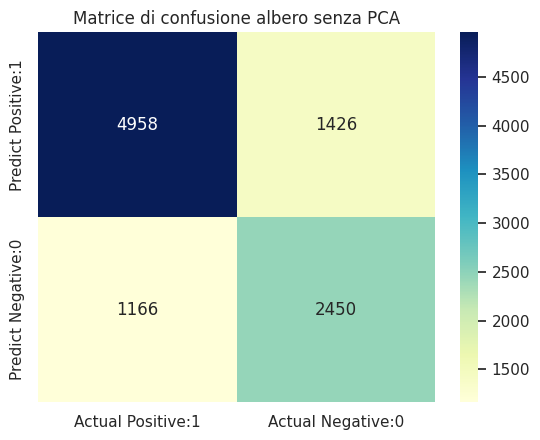

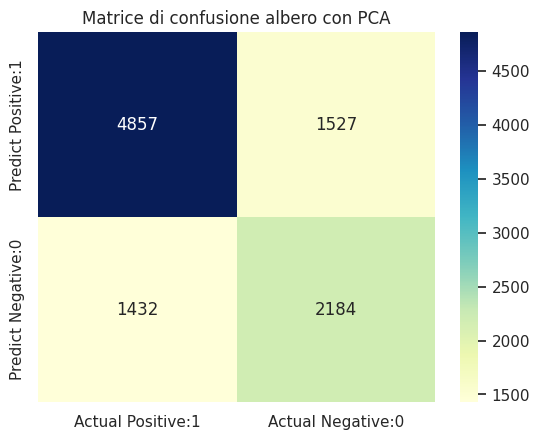

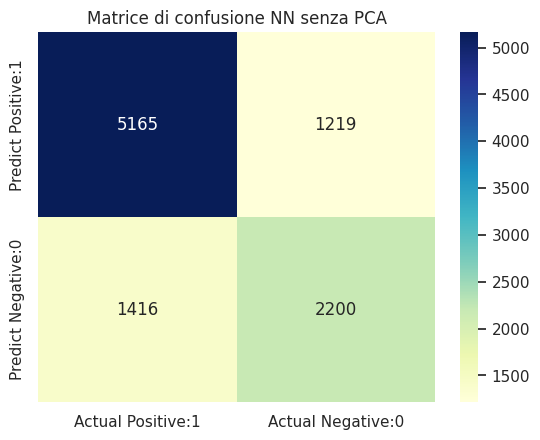

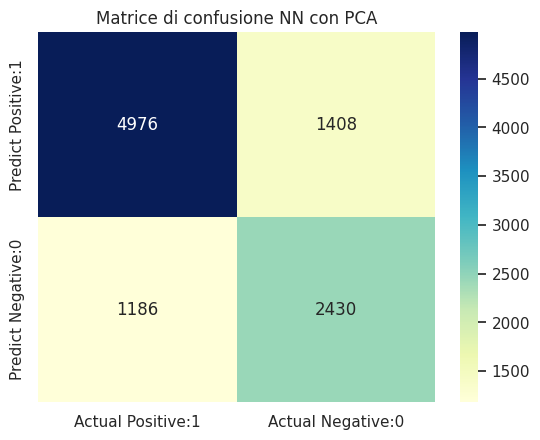

In [ ]:
import seaborn as sns

# Converti i valori della matrice di confusione in interi
confusion_matrix_total_tree = confusion_matrix_total_tree.astype(int)
confusion_matrix_total_tree_pca = confusion_matrix_total_tree_pca.astype(int)
confusion_matrix_total_nn = confusion_matrix_total_nn.astype(int)
confusion_matrix_total_nn_pca = confusion_matrix_total_nn_pca.astype(int)

# Creazione delle matrici di confusione come DataFrame
cm_matrix_tree = pd.DataFrame(data=confusion_matrix_total_tree, columns=['Actual Positive:1', 'Actual Negative:0'],
                                 index=['Predict Positive:1', 'Predict Negative:0'])
cm_matrix_tree_pca = pd.DataFrame(data=confusion_matrix_total_tree_pca, columns=['Actual Positive:1', 'Actual Negative:0'],
                                 index=['Predict Positive:1', 'Predict Negative:0'])
cm_matrix_nn = pd.DataFrame(data=confusion_matrix_total_nn, columns=['Actual Positive:1', 'Actual Negative:0'],
                                 index=['Predict Positive:1', 'Predict Negative:0'])
cm_matrix_nn_pca = pd.DataFrame(data=confusion_matrix_total_nn_pca, columns=['Actual Positive:1', 'Actual Negative:0'],
                                 index=['Predict Positive:1', 'Predict Negative:0'])


# Visualizzazione della matrice di confusione per l'albero senza PCA
sns.heatmap(cm_matrix_tree, annot=True, fmt='d', cmap='YlGnBu')
plt.title("Matrice di confusione albero senza PCA")
plt.show()

# Visualizzazione della matrice di confusione per l'albero con PCA
sns.heatmap(cm_matrix_tree_pca, annot=True, fmt='d', cmap='YlGnBu')
plt.title("Matrice di confusione albero con PCA")
plt.show()

# Visualizzazione della matrice di confusione per la rete neurale senza PCA
sns.heatmap(cm_matrix_nn, annot=True, fmt='d', cmap='YlGnBu')
plt.title("Matrice di confusione NN senza PCA")
plt.show()

# Visualizzazione della matrice di confusione per la rete neurale con PCA
sns.heatmap(cm_matrix_nn_pca, annot=True, fmt='d', cmap='YlGnBu')
plt.title("Matrice di confusione NN con PCA")
plt.show()


####Confronto dei modelli a seguito della Cross Validation

Confrontiamo gli intervalli di confidenza ottenuti dalla cross-validation attraverso un errorbar plot, che è un tipo di grafico utilizzato per mostrare la variabilità di un dato rispetto alla sua media. In questo contesto, mostriamo la media dell'accuratezza dei modelli e l'intervallo di confidenza associato, fornendo così una rappresentazione visiva della variabilità delle loro performance.

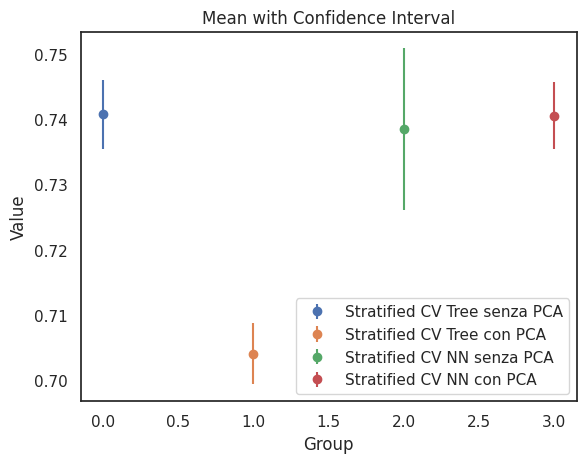

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

# Calcola la media dei valori di accuratezza ottenuti per ogni fold per il modello di albero decisionale senza PCA
mean_value = np.mean(accuracy_stratified_tree)

# Plotta gli intervalli di confidenza per il modello di albero decisionale senza PCA
plt.errorbar(0, mean_value, yerr=(interval_tree[1] - interval_tree[0])/2, fmt='o', label='Stratified CV Tree senza PCA')

# Calcola la media dei valori di accuratezza ottenuti per ogni fold per il modello di albero decisionale con PCA
mean_value = np.mean(accuracy_stratified_tree_pca)

# Plotta gli intervalli di confidenza per il modello di albero decisionale con PCA
plt.errorbar(1, mean_value, yerr=(interval_tree_pca[1] - interval_tree_pca[0])/2, fmt='o', label='Stratified CV Tree con PCA')

# Calcola la media dei valori di accuratezza ottenuti per ogni fold per il modello di NN senza PCA
mean_value = np.mean(accuracy_stratified_nn)

# Plotta gli intervalli di confidenza per il modello di NN senza PCA
plt.errorbar(2, mean_value, yerr=(interval_nn[1] - interval_nn[0])/2, fmt='o', label='Stratified CV NN senza PCA')

# Calcola la media dei valori di accuratezza ottenuti per ogni fold per il modello di NN con PCA
mean_value = np.mean(accuracy_stratified_nn_pca)

# Plotta gli intervalli di confidenza per il modello di NN con PCA
plt.errorbar(3, mean_value, yerr=(interval_nn_pca[1] - interval_nn_pca[0])/2, fmt='o', label='Stratified CV NN con PCA')

plt.xlabel('Group')
plt.ylabel('Value')
plt.title('Mean with Confidence Interval')

plt.legend(loc='lower right')
plt.show()


Confrontiamo anche i tempi di Cross-Validation

In [ ]:
print(f'Tempo di cross validation DecisionTree senza PCA: {cv_time_decisiontree:.3f} secondi')
print(f'Tempo di cross validation DecisionTree con PCA: {cv_time_decisiontree_pca:.3f} secondi')

print(f'Tempo di cross validation NN senza PCA: {cv_time_nn:.3f} secondi')
print(f'Tempo di cross validation NN con PCA: {cv_time_nn_pca:.3f} secondi')

Tempo di cross validation DecisionTree senza PCA: 0.323 secondi
Tempo di cross validation DecisionTree con PCA: 0.480 secondi
Tempo di cross validation NN senza PCA: 673.032 secondi
Tempo di cross validation NN con PCA: 608.750 secondi


Confrontiamo le curve ROC dei vari modelli utilizzando i valori ottenuti calcolando la media dei tassi di falsi positivi (fpr), dei tassi di veri positivi (tpr) e dell'Area Under the Curve (AUC) a partire dai valori raccolti in ogni iterazione della cross-validation per ciascun modello.

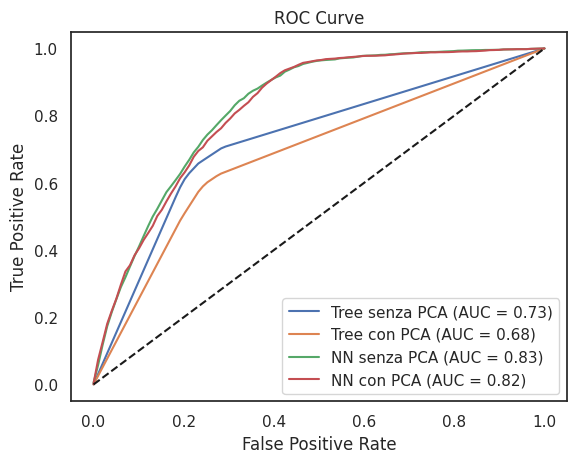

In [ ]:
# Plotta la curva ROC dei vari modelli per comparare le performance
plt.plot(mean_interpolated_fpr_tree, mean_interpolated_tpr_tree, label=f'Tree senza PCA (AUC = {mean_auc_tree:.2f})')
plt.plot(mean_interpolated_fpr_tree_pca, mean_interpolated_tpr_tree_pca, label=f'Tree con PCA (AUC = {mean_auc_tree_pca:.2f})')

plt.plot(mean_interpolated_fpr_nn, mean_interpolated_tpr_nn, label=f'NN senza PCA (AUC = {mean_auc_nn:.2f})')
plt.plot(mean_interpolated_fpr_nn_pca, mean_interpolated_tpr_nn_pca, label=f'NN con PCA (AUC = {mean_auc_nn_pca:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

**Le osservazioni sui risultati ottenuti sono riportate sulla relazione**